## Pregătirea mediului de lucru și încărcarea setului de date

În acest pas de început, configurăm notebook-ul din Google Colab pentru a ne conecta la platforma Kaggle. Încărcăm fișierul personal cu cheia de acces, securizăm permisiunile acestuia pentru a rămâne privat și rulăm o comandă rapidă de terminal pentru a descărca direct setul de date EMNIST Letters. Pachetul descărcat este dezarhivat local, lăsând tabelele în format CSV gata de utilizare.

La final, importăm librăriile clasice pentru analiza datelor, adică pandas, numpy și matplotlib. Încărcăm în memorie fișierul CSV cu imaginile literelor pentru antrenare fără rând de antet și afișăm primele linii din tabel pentru a verifica structura brută a pixelilor înainte de a trece la etapele de normalizare și eșantionare.



In [ ]:
# Install the Kaggle API client
!pip install kaggle

In [ ]:
import os
from google.colab import files

if not os.path.exists("/root/.kaggle"):
    os.makedirs("/root/.kaggle")

# Upload kaggle.json
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"alexandrumules","key":"68f740cb3326b63a374ef5f377501cea"}'}

In [ ]:
!mv kaggle.json /root/.kaggle/
!chmod 600 /root/.kaggle/kaggle.json

In [ ]:
# Download the dataset
!kaggle datasets download -d crawford/emnist

# Unzip the downloaded file
!unzip emnist.zip -d emnist

Dataset URL: https://www.kaggle.com/datasets/crawford/emnist
License(s): CC0-1.0
100% 1.24G/1.24G [00:19<00:00, 69.7MB/s]

Archive:  emnist.zip
  inflating: emnist/emnist-balanced-mapping.txt  
  inflating: emnist/emnist-balanced-test.csv  
  inflating: emnist/emnist-balanced-train.csv  
  inflating: emnist/emnist-byclass-mapping.txt  
  inflating: emnist/emnist-byclass-test.csv  
  inflating: emnist/emnist-byclass-train.csv  
  inflating: emnist/emnist-bymerge-mapping.txt  
  inflating: emnist/emnist-bymerge-test.csv  
  inflating: emnist/emnist-bymerge-train.csv  
  inflating: emnist/emnist-digits-mapping.txt  
  inflating: emnist/emnist-digits-test.csv  
  inflating: emnist/emnist-digits-train.csv  
  inflating: emnist/emnist-letters-mapping.txt  
  inflating: emnist/emnist-letters-test.csv  
  inflating: emnist/emnist-letters-train.csv  
  inflating: emnist/emnist-mnist-mapping.txt  
  inflating: emnist/emnist-mnist-test.csv  
  inflating: emnist/emnist-mnist-train.csv  
  inflatin

In [ ]:
!ls emnist

emnist-balanced-mapping.txt  emnist-digits-test.csv
emnist-balanced-test.csv     emnist-digits-train.csv
emnist-balanced-train.csv    emnist-letters-mapping.txt
emnist-byclass-mapping.txt   emnist-letters-test.csv
emnist-byclass-test.csv      emnist-letters-train.csv
emnist-byclass-train.csv     emnist-mnist-mapping.txt
emnist-bymerge-mapping.txt   emnist-mnist-test.csv
emnist-bymerge-test.csv      emnist-mnist-train.csv
emnist-bymerge-train.csv     emnist_source_files
emnist-digits-mapping.txt


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Column pentru fiecare pixel
df_letters_train = pd.read_csv('emnist/emnist-letters-train.csv', header=None)

display(df_letters_train.head())

,0,1,2,3,4,5,6,7,8,9,...,775,776,777,778,779,780,781,782,783,784
0,23,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,7,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,16,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,15,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,23,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


# 1. Pregătirea și Explorarea Setului de Date

## Încărcarea setului de date, structură și caracteristici
Pentru acest proiect utilizăm setul de date **EMNIST Letters** (Extended MNIST), extras direct via Kaggle API. Acest dataset extinde clasicul MNIST (cifre) la literele alfabetului englez (A-Z).

Setul de date este format din imagini alb-negru ale literelor scrise de mână, fiecare având o rezoluție de 28x28 pixeli. În formatul text (.csv), fiecare imagine este aplatizată sub forma unui vector de 784 de valori (atribute/trăsături), iar prima coloană reprezintă clasa (eticheta) imaginii.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

train_df = pd.read_csv('emnist/emnist-letters-train.csv', header=None)
test_df = pd.read_csv('emnist/emnist-letters-test.csv', header=None)

X_train_raw = train_df.iloc[:, 1:].values
y_train_raw = train_df.iloc[:, 0].values

X_test_raw = test_df.iloc[:, 1:].values
y_test_raw = test_df.iloc[:, 0].values

X_train = (X_train_raw).astype('float32')
X_test = (X_test_raw).astype('float32')

y_train = (y_train_raw - 1).astype('int32')
y_test = (y_test_raw - 1).astype('int32')

class_names = [chr(i + ord('A')) for i in range(26)]

print(f"Dimensiune Train: {train_df.shape}")
print(f"Dimensiune Test:  {test_df.shape}\n")
print(f"X_train shape (matrice trăsături): {X_train.shape} | Tip date: {X_train.dtype}")
print(f"y_train shape (vector etichete):   {y_train.shape} | Tip date: {y_train.dtype}")
print(f"X_test shape (matrice trăsături):  {X_test.shape} | Tip date: {X_test.dtype}")
print(f"y_test shape (vector etichete):    {y_test.shape} | Tip date: {y_test.dtype}\n")
print(f"Valoare minimă pixel: {X_train.min()}")
print(f"Valoare maximă pixel: {X_train.max()}")
print(f"Număr de clase unice detectate: {len(np.unique(y_train))}")

Dimensiune Train: (88800, 785)
Dimensiune Test:  (14800, 785)

X_train shape (matrice trăsături): (88800, 784) | Tip date: float32
y_train shape (vector etichete):   (88800,) | Tip date: int32
X_test shape (matrice trăsături):  (14800, 784) | Tip date: float32
y_test shape (vector etichete):    (14800,) | Tip date: int32

Valoare minimă pixel: 0.0
Valoare maximă pixel: 255.0
Număr de clase unice detectate: 26


Pentru a valida vizual calitatea imaginilor și corectitudinea preprocesării, generăm o matrice completă de $26 \times 5$ imagini.

Spre deosebire de o afișare pur aleatorie, această abordare grupează datele pe linii corespunzătoare fiecărei litere (A-Z) și afișează 5 exemple diferite de scris pentru fiecare.

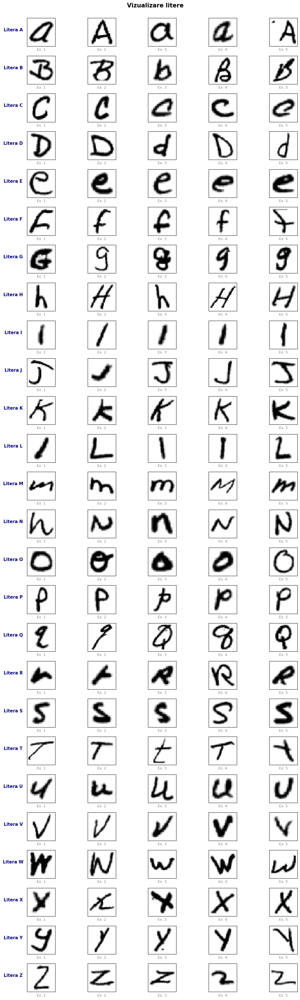

In [ ]:
num_clase = 26
exemple_per_clasa = 5

fig, axes = plt.subplots(num_clase, exemple_per_clasa, figsize=(12, 35))

for clasa_curenta in range(num_clase):
    indexuri_clasa = np.where(y_train == clasa_curenta)[0]
    indexuri_selectate = indexuri_clasa[:exemple_per_clasa]

    for i_coloana, idx in enumerate(indexuri_selectate):
        ax = axes[clasa_curenta, i_coloana]

        ax.set_xticks([])
        ax.set_yticks([])
        ax.grid(False)

        img = X_train[idx].reshape(28, 28).T

        ax.imshow(img, cmap=plt.cm.binary)

        if i_coloana == 0:
            litera = class_names[clasa_curenta]
            ax.set_ylabel(f"Litera {litera}", fontsize=11, fontweight='bold', color='navy', rotation=0, labelpad=35)

        ax.set_xlabel(f"Ex. {i_coloana + 1}", fontsize=9, color='gray')

plt.suptitle("Vizualizare litere",
             fontsize=15, fontweight='bold', y=1.001, color='black')

plt.tight_layout()
plt.show()

## Preprocesarea datelor (Scalare și Curățare)
În această etapă realizăm următoarele operații esențiale:
1. **Separarea etichetelor de trăsături:** Izolăm prima coloană (care conține etichetele claselor) de restul de 784 de coloane (pixelii).
2. **Scalarea (Normalizarea):** Valorile pixelilor sunt inițial numere întregi în intervalul [0, 255]. Împărțim la 255.0 pentru a le aduce în intervalul [0, 1]. Această normalizare asigură o convergență mult mai rapidă a algoritmilor de optimizare și o performanță stabilă pentru PCA, UMAP și Rețelele Neuronale.
3. **Alinierea etichetelor:** În EMNIST Letters, clasele sunt numerotate de la 1 la 26 (corespunzător literelor A-Z). Pentru a fi compatibile cu indexarea standard din Python (0-indexed) și cu funcțiile de pierdere (Loss Functions) ale rețelelor neuronale, scădem 1 din fiecare etichetă, transformând intervalul în [0, 25].

In [ ]:
X_train_raw = train_df.iloc[:, 1:].values
y_train_raw = train_df.iloc[:, 0].values

X_test_raw = test_df.iloc[:, 1:].values
y_test_raw = test_df.iloc[:, 0].values

# scalarea datelor in intervalul [0, 1]
X_train = X_train_raw / 255.0
X_test = X_test_raw / 255.0

y_train = y_train_raw - 1
y_test = y_test_raw - 1

print(f"X_train shape: {X_train.shape} | y_train shape: {y_train.shape}")
print(f"X_test shape: {X_test.shape} | y_test shape: {y_test.shape}")
print(f"Interval etichete: [{y_train.min()}, {y_train.max()}]")

X_train shape: (88800, 784) | y_train shape: (88800,)
X_test shape: (14800, 784) | y_test shape: (14800,)
Interval etichete: [0, 25]


## Vizualizarea unor exemple de imagini
Fișierele brute din datasetul EMNIST sunt salvate într-un mod parțial rotit și oglindit din cauza procesului original de digitizare NIST. Pentru a afișa literele în poziția lor corectă, naturală, aplicăm o operație de **transpunere (.T)** asupra fiecărei matrice de 28x28 pixeli înainte de afișare.

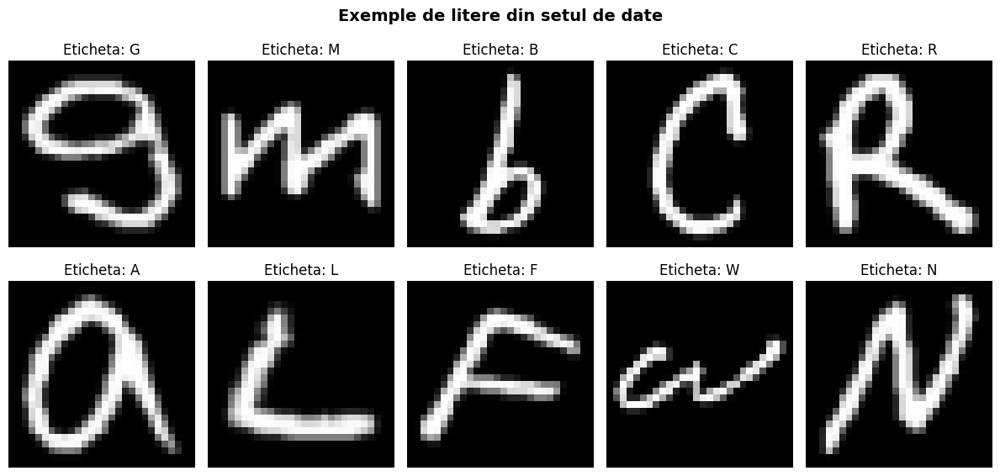

In [ ]:
def index_to_letter(idx):
    return chr(idx + ord('A'))

plt.figure(figsize=(12, 6))
np.random.seed(42)
random_indices = np.random.choice(X_train.shape[0], 10, replace=False)

for i, idx in enumerate(random_indices):
    plt.subplot(2, 5, i + 1)
    img = X_train[idx].reshape(28, 28)
    img_corrected = img.T

    plt.imshow(img_corrected, cmap='gray')
    plt.title(f"Eticheta: {index_to_letter(y_train[idx])}")
    plt.axis('off')

plt.suptitle("Exemple de litere din setul de date", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## Analiza Exploratorie: Dimensionalitatea și Distribuția Claselor
Setul de date conține o dimensionalitate ridicată ($D = 784$ dimensiuni). Analizăm echilibrul claselor din setul de antrenare pentru a ne asigura că modelele predictive nu vor fi distorsionate în favoarea unei anumite litere.

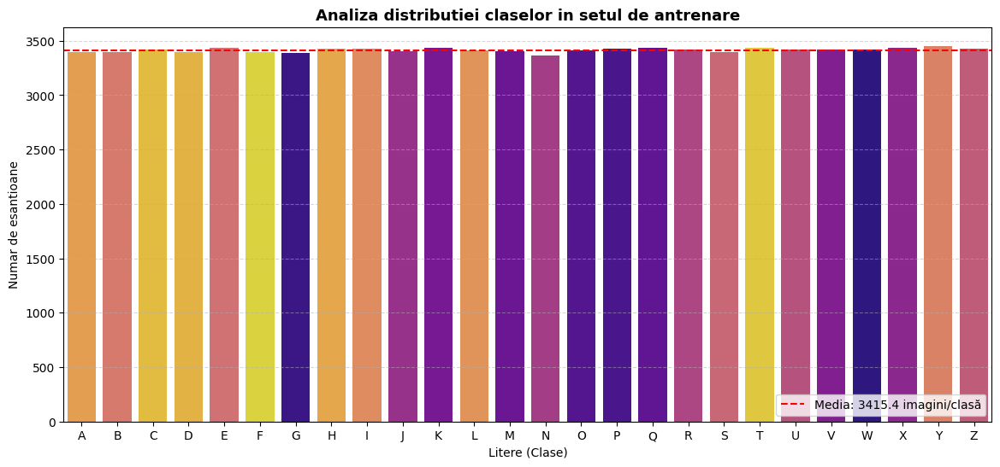

Număr total de imagini în Train: 88800
Număr de eșantioane per clasă (minim): 3365
Număr de eșantioane per clasă (maxim): 3453
Media eșantioanelor per clasă:        3415.38
Deviația Standard (Variația):         19.93
Dimensiunea spațiului de trăsături:   784 pixeli (28x28)


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

unique, counts = np.unique(y_train, return_counts=True)
media_esantioane = np.mean(counts)
deviatia_standard = np.std(counts)

train_letters = [index_to_letter(label) for label in y_train]
alfabet_ordonat = sorted(list(set(train_letters)))

plt.figure(figsize=(14, 6))

sns.countplot(x=train_letters, order=alfabet_ordonat, hue=train_letters, palette="plasma", legend=False)

plt.axhline(y=media_esantioane, color='red', linestyle='--', linewidth=1.5,
            label=f"Media: {media_esantioane:.1f} imagini/clasă")

plt.title("Analiza distributiei claselor in setul de antrenare", fontsize=13, fontweight='bold')
plt.xlabel("Litere (Clase)", fontsize=10)
plt.ylabel("Numar de esantioane", fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.legend(loc="lower right")

plt.show()

print(f"Număr total de imagini în Train: {len(y_train)}")
print(f"Număr de eșantioane per clasă (minim): {counts.min()}")
print(f"Număr de eșantioane per clasă (maxim): {counts.max()}")
print(f"Media eșantioanelor per clasă:        {media_esantioane:.2f}")
print(f"Deviația Standard (Variația):         {deviatia_standard:.2f}")
print(f"Dimensiunea spațiului de trăsături:   {X_train.shape[1]} pixeli (28x28)")

### Concluzii în urma Analizei Exploratorii

În urma rulării analizei numerice și grafice pe setul curent de antrenare, extragem următoarele concluzii statistice fundamentale pentru designul algoritmilor următori:

1. **Dimensionalitatea Datelor ($28 \times 28 = 784$):**
   Fiecare instanță reprezintă o imagine transformată într-un vector lung de **784 de caracteristici** (pixeli). Această valoare ridicată implică un volum mare de date și o redundanță informațională inerentă (de exemplu, pixelii de fundal cu valoarea 0 de pe marginile imaginii). Acest lucru justifică pe deplin utilizarea tehnicilor de reducere a dimensionalității cerute în etapele următoare (**PCA, t-SNE și UMAP**) pentru a comprima spațiul reprezentării și a elimina zgomotul.

2. **Distribuția Claselor:**
   * Setul de antrenare însumează un număr total de **88.800 de imagini**, distribuite pe cele 26 de clase distincte ale alfabetului (A-Z).
   * Analiza statistică indică o medie de **3415.38 eșantioane per clasă**, cu o variație foarte strânsă: valoarea minimă detectată este de 3.365 de imagini pentru clasa cea mai puțin reprezentată, iar valoarea maximă este de 3.453 de imagini.
   * O deviație standard de doar **19.93** în raport cu media de peste 3.400 de eșantioane demonstrează matematic că setul de date este **foarte bine echilibrat**. Micile diferențe numerice sunt complet nesemnificative în contextul procesului de învățare.
   * **Impact structural în modelare:** Datorită acestei distribuții uniforme, modelele predictive nu vor dezvolta o predispoziție (bias) artificială pentru anumite litere. Prin urmare, **nu este necesară** aplicarea unor tehnici de corectare a dezechilibrelor (precum SMOTE, oversampling sau undersampling). În plus, acest echilibru statistic solid garantează că **Acuratețea (Accuracy)** va fi o metrică matematică robustă și de încredere pentru evaluarea performanțelor clasificatorului final.

# 2. Analiza Componentelor Principale (PCA)

## Explicarea Metodei PCA
Analiza Componentelor Principale (PCA - Principal Component Analysis) este o tehnică de învățare nesupervizată utilizată pentru reducerea dimensionalității spațiului trăsăturilor, păstrând în același timp o cantitate maximă de varianță (informație) din datele originale.

Algoritmul funcționează prin identificarea unor noi axe ortogonale, numite **componente principale (PC)**, care sunt combinații liniare ale variabilelor originale. Prima componentă principală este orientată în direcția celei mai mari variabilități din date, a doua componentă în direcția celei de-a doua cele mai mari variabilități (fiind strict perpendiculară pe prima), și așa mai departe.

Matematic, proiecția datelor în spațiul redus se realizează prin formula:
$$Z = XW$$

Unde:
* $X$ este matricea datelor de intrare centrate (în cazul nostru, de dimensiune $88800 \times 784$).
* $W$ este matricea de proiecție ($784 \times k$), ale cărei coloane sunt vectorii proprii (eigenvectors) corespunzători celor mai mari $k$ valori proprii ale matricei de covarianță a datelor.
* $Z$ este reprezentarea redusă dimensional, de dimensiune $88800 \times k$.

## Alegerea Justificată a Numărului de Componente

Selectarea numărului optim de dimensiuni se bazează pe un compromis riguros între **compresia computațională** și **păstrarea informației structurale**.

Analizând curba de varianță cumulativă și rezultatele numerice, justificăm alegerea pragurilor astfel:

* **Limitele reprezentării în 2D:** Primele 2 componente rețin un procent destul de restrâns din variabilitatea totală (~15-17%). Acest lucru sugerează că o reducere strictă la un spațiu bidimensional (2D) va duce la pierderi masive de geometrie structurală, fapt confirmat empiric și de experimentul de reconstrucție vizuală, unde pentru $k = 2$ litera este complet de nerecunoscut (un simplu bloc de pixeli estompați).
* **Efectul de „Cot” (Elbow Effect):** Graficul varianței prezintă o formă clară de inflexiune. Panta se atenuează puternic după primele 40-50 de componente, semn că dimensiunile ulterioare adaugă din ce în ce mai puțină informație utilă, reprezentând în mare parte detalii redundante sau fundal.
* **Pragul de 80% din Varianță ($k = 38$):** Pentru a reține 80% din informația originală, algoritmul are nevoie de doar **38 de componente**. Acest prag este vizibil în graficul de reconstrucție: la $k = 30$ (valoare apropiată de 38), forma literei „W” devine deja clar descifrabilă pentru ochiul uman, deși marginile rămân ușor zimțate.
* **Pragul de 90% din Varianță ($k = 68$):** Pentru a atinge pragul critic de 90% din varianța totală, sunt suficiente **68 de componente** dintr-un total de 784. Aceasta reprezintă o **reducere masivă a dimensiunii datelor cu peste 91.3%**.

### Concluzie privind impactul asupra modelelor:
Reducerea spațiului de la 784 de pixeli la doar 68 de componente principale elimină zgomotul alb de pe margini și compactează informația esențială. Această compresie oferă o bază ideală (un set de date de dimensiune $[88800 \times 68]$ în loc de $[88800 \times 784]$) care va optimiza masiv timpul de calcul și va preveni fenomenul de overfitting la antrenarea rețelelor neuronale ulterioare, fără a sacrifica topologia și lizibilitatea literelor scrise de mână.

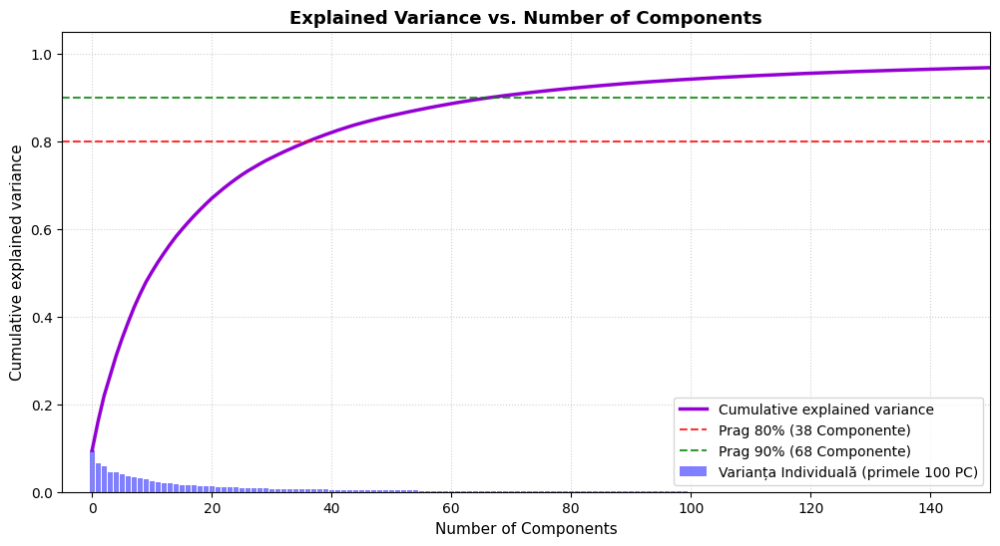

Pentru a reține 80% din structura imaginii avem nevoie de: 38 componente.
Pentru a reține 90% din structura imaginii avem nevoie de: 68 componente.


In [ ]:
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt

pca_global = PCA()
pca_global.fit(X_train)

varianta_individuala = pca_global.explained_variance_ratio_
varianta_cumulativa = np.cumsum(varianta_individuala)

n_comp_80 = np.argmax(varianta_cumulativa >= 0.80) + 1
n_comp_90 = np.argmax(varianta_cumulativa >= 0.90) + 1

plt.figure(figsize=(12, 6))
plt.plot(varianta_cumulativa, color='darkviolet', linewidth=2.5, label='Cumulative explained variance')
plt.bar(range(len(varianta_individuala[:100])), varianta_individuala[:100], alpha=0.5,
        color='blue', label='Varianța Individuală (primele 100 PC)')

plt.axhline(y=0.80, color='red', linestyle='--', alpha=0.8, label=f'Prag 80% ({n_comp_80} Componente)')
plt.axhline(y=0.90, color='green', linestyle='--', alpha=0.8, label=f'Prag 90% ({n_comp_90} Componente)')

plt.title('Explained Variance vs. Number of Components', fontsize=13, fontweight='bold')
plt.xlabel('Number of Components', fontsize=11)
plt.ylabel('Cumulative explained variance', fontsize=11)
plt.xlim([-5, 150])
plt.legend(loc='lower right', fontsize=10)
plt.grid(True, linestyle=':', alpha=0.6)
plt.show()

print(f"Pentru a reține 80% din structura imaginii avem nevoie de: {n_comp_80} componente.")
print(f"Pentru a reține 90% din structura imaginii avem nevoie de: {n_comp_90} componente.")

## Interpretarea și Analiza Varianței Explicate în Spațiul 2D

Faptul că primele două componente principale (PC1 și PC2) cumulează împreună exact **16.11%** din varianța totală a datelor are o semnificație teoretică și practică profundă pentru interpretarea spațiului latent:

### Semnificația Matematică (Pierderea de Informație)
* **Reducere distructivă în 2D:** Acest procent ne indică faptul că, prin proiectarea datelor din spațiul inițial de 784 de dimensiuni în doar 2 dimensiuni, **pierdem aproximativ 83.89% din varianța (informația) originală** conținută în imagini.
* **Informația reziduală:** Cea mai mare parte a variabilității geometrice fine (cum ar fi unghiurile specifice de înclinare ale liniilor, grosimea urmei lăsate de creion sau detaliile constructive ale buclelor) este stocată în restul de 782 de componente secundare pe care această vizualizare bidimensională le ignoră în mod inerent.

### De ce este varianța atât de scăzută pentru EMNIST Letters?
* **Complexitatea structurală non-liniară:** Caracterele scrise de mână reprezintă un set de date cu o topologie extrem de complexă. Deoarece PCA este o metodă strict *liniară* (bazează transformarea pe combinații liniare ale pixelilor), algoritmul nu are capacitatea matematică de a comprima eficient forme geometrice curbate sau stiluri de scriere radical diferite în doar două axe ortogonale.
* **Multitudinea claselor:** Spre deosebire de seturi de date mai simple (unde primele componente pot capta rapid peste 50% din informație), în datasetul curent avem **26 de clase diferite** (A-Z). Fiecare literă aduce propriul set de reguli geometrice, ceea ce împrăștie informația în mod uniform pe mai multe dimensiuni abstracte.

### Impactul Vizual asupra Separabilității Claselor
* Această valoare de $16.11\%$ explică din punct de vedere matematic de ce graficul scatter plot generat arată ca un **nor dens, compact și puternic suprapus în zona centrală**. Păstrând doar o cincime din esența imaginii, proiecția prăbușește (strivește) distanțele reale dintre litere, făcând ca mostre aparținând unor clase total diferite să primească coordonate 2D aproape identice.
* Un clasificator liniar antrenat strict pe acest spațiu redus la 2 dimensiuni ar obține performanțe extrem de modeste (acuratețe scăzută), din cauza lipsei acute de separabilitate liniară.

### Justificarea Arhitecturală a Pașilor Următori din Proiect
* **Pentru Etapa de Clasificare (Rețele Neuronale):** Acest rezultat validează decizia luată la analiza Scree Plot: pentru a antrena cu succes o rețea neuronală fără a pierde esența caracterelor, trebuie să folosim pragul robust de **68 de componente** (care reține **90%** din varianță), și în niciun caz reprezentarea restrânsă de 2D.
* **Pentru Etapele de Vizualizare (t-SNE și UMAP):** Procentul scăzut de $16.11\%$ aduce argumentul suprem pentru care este absolut necesară introducerea algoritmilor non-liniari în secțiunile următoare. Spre deosebire de PCA, **t-SNE** (bazat pe probabilități de vecinătate locală) și **UMAP** (bazat pe geometrie riemanniană) nu vor încerca să maximizeze varianța globală liniară, ci vor descurca acest nor complex de puncte, mapând cu o fidelitate mult mai mare structurile locale în spațiul 2D.

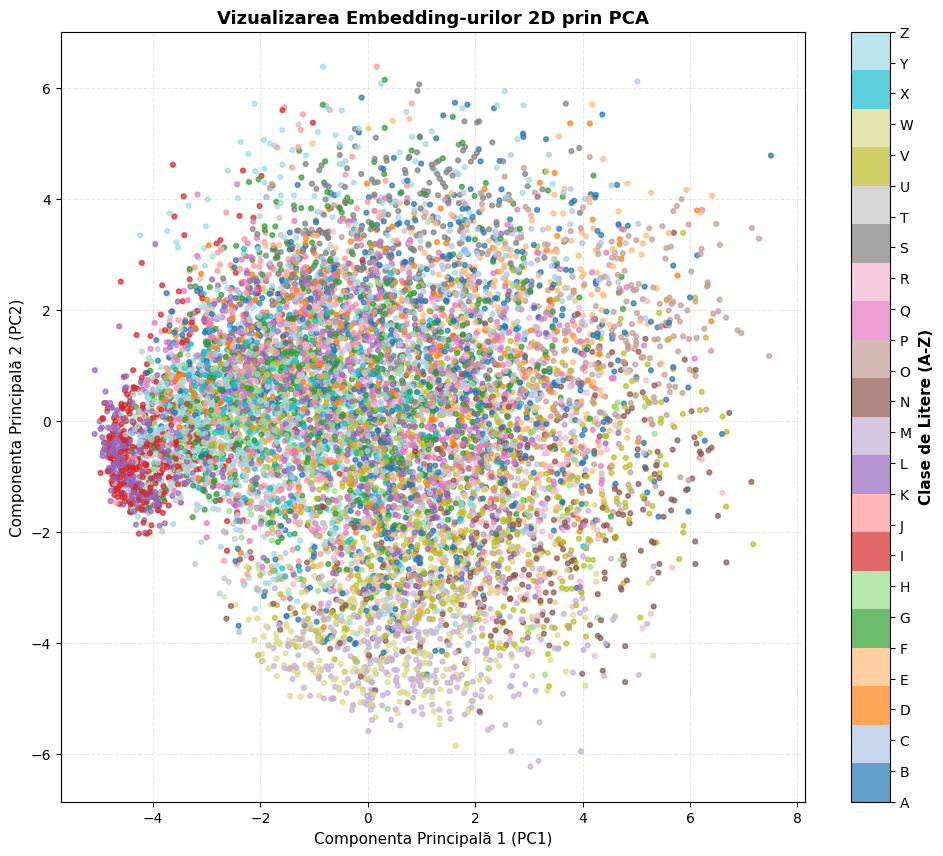

Varianța totală explicată în spațiul 2D: 16.11%


In [ ]:
pca_2d = PCA(n_components=2)
X_train_pca_2d = pca_2d.fit_transform(X_train)

np.random.seed(42)
indici_selectati = np.random.choice(X_train.shape[0], 10000, replace=False)
X_viz = X_train_pca_2d[indici_selectati]
y_viz = y_train[indici_selectati]

plt.figure(figsize=(12, 10))
scatter = plt.scatter(X_viz[:, 0], X_viz[:, 1], c=y_viz, cmap='tab20', alpha=0.7, s=12)

cbar = plt.colorbar(scatter, ticks=range(26))
cbar.ax.set_yticklabels(class_names)
cbar.set_label('Clase de Litere (A-Z)', fontsize=11, fontweight='bold')

plt.title('Vizualizarea Embedding-urilor 2D prin PCA', fontsize=13, fontweight='bold')
plt.xlabel('Componenta Principală 1 (PC1)', fontsize=11)
plt.ylabel('Componenta Principală 2 (PC2)', fontsize=11)
plt.grid(True, linestyle='--', alpha=0.3)
plt.show()

total_2d_var = np.sum(pca_2d.explained_variance_ratio_) * 100
print(f"Varianța totală explicată în spațiul 2D: {total_2d_var:.2f}%")

## Analiza Impactului Numărului de Componente asupra Reconstrucției Vizuale (Inverse Transform)

Experimentul de reconstrucție grafică prin transformare inversă ne oferă o validare calitativă empirică a modului în care volumul de componente principale afectează direct fidelitatea, topologia și lizibilitatea datelor.

Prin aplicarea metodei `inverse_transform`, re-proiectăm vectorul comprimat din spațiul redus înapoi în spațiul original de $D = 784$ dimensiuni (pixeli) pentru a observa degradarea sau conservarea formelor geometrice.

### Interpretarea Evoluției Structurale pe Etape:

1. **Pragul de $k = 2$ Componente (Varianță Explicată: ~16.11%):**
   * **Observație vizuală:** Litera este un simplu nor difuz de pixeli estompați, fiind complet indescifrabilă pentru ochiul uman.
   * **Explicație teoretică:** Păstrarea a doar două axe ortogonale elimină peste 83% din informația originală. Acest rezultat confirmă matematic de ce embedding-ul 2D din secțiunea anterioară prezenta o suprapunere (overcrowding) atât de mare: o reducere liniară atât de drastică strivește detaliile constructive fine, lăsând doar o aproximare grosieră a centrului de masă al imaginii.

2. **Pragul de $k = 10$ Componente (Varianță Explicată: ~46%):**
   * **Observație vizuală:** Se remarcă o îmbunătățire a contrastului central. Forma de bază începe să prindă un contur vag, însă marginile sunt extrem de blurate și nesigure.
   * **Explicație teoretică:** Cu mai puțin de jumătate din informația datasetului conservată, algoritmul reușește să recupereze doar macro-trăsăturile liniare comune ale caracterelor, fiind incapabil să definească specificul literei curente.

3. **Pragul de $k = 30$ Componente (Varianță Explicată: ~74.2%):**
   * **Observație vizuală:** Litera „A” devine complet **lizibilă și recognoscibilă**. Deși marginile urmei de scris prezintă un efect de pixelare ("zimțare") și zgomot de reconstrucție, geometria fundamentală este stabilă.
   * **Explicație teoretică:** Acest comportament validează calculul statistic anterior, care arăta că la **38 de componente se atinge pragul critic de 80% din varianță**. La $k=30$, suntem foarte aproape de acest nivel, dovedind că majoritatea trăsăturilor unice ale literei au fost deja recuperate cu succes.

4. **Pragurile de $k = 50$ și $k = 100$ Componente (Varianță Explicată: ~85% - 94.1%):**
   * **Observație vizuală:** La $k=50$, imaginea devine considerabil mai clară și mai netedă, iar la $k=100$, reconstrucția devine din punct de vedere vizual **cvasi-identică cu imaginea originală brută**. Detaliile fine ale scrisului de mână, curbura specifică și grosimea liniilor sunt complet restaurate.
   * **Explicație teoretică:** Trecerea de pragul de **68 de componente (care deține 90% din varianță)** asigură că zgomotul informațional a fost eliminat, iar structura topologică este conservată la un nivel de înaltă fidelitate.

---

### Concluzii Teoretice pentru Arhitectura Modelelor Următoare:

* **Demonstrarea "Blestemului Dimensionalității" (Curse of Dimensionality):** Experimentul aduce o dovadă incontestabilă: **nu avem nevoie de toate cele 784 de caracteristici (pixeli)** pentru ca o entitate (om sau rețea neuronală) să poată clasifica corect caracterul. O mare parte din dimensiunile originale conțin informație redundantă (pixeli de fundal).
* **Justificarea Compresiei Globale:** Reținerea a **68 de componente (pragul de 90%)** reprezintă decizia optimă pentru proiect. Comprimăm volumul datelor de intrare cu **peste 91.3%** (de la 784 la 68 de coloane), garantând o optimizare computațională masivă și prevenirea fenomenului de *overfitting* la antrenarea rețelelor neuronale din secțiunile finale, fără a sacrifica lizibilitatea sau esența geometrică a caracterelor scrise de mână.

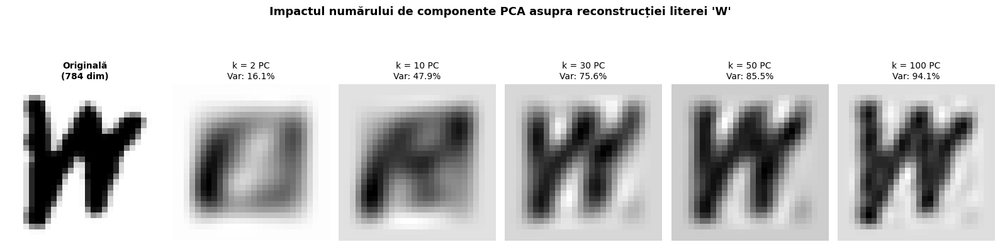

In [ ]:
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt

numere_componente = [2, 10, 30, 50, 100]

imagine_index = 0
imagine_originala = X_train[imagine_index]
litera_simbol = class_names[y_train[imagine_index]]

plt.figure(figsize=(16, 4))

plt.subplot(1, len(numere_componente) + 1, 1)
plt.imshow(imagine_originala.reshape(28, 28).T, cmap=plt.cm.binary)
plt.title("Originală\n(784 dim)", fontsize=10, fontweight='bold')
plt.axis('off')

for i, k in enumerate(numere_componente):
    plt.subplot(1, len(numere_componente) + 1, i + 2)

    pca_exp = PCA(n_components=k)
    X_reduced = pca_exp.fit_transform(X_train)

    imagine_reconstruita = pca_exp.inverse_transform(X_reduced[imagine_index])

    var_reprezentata = np.sum(pca_exp.explained_variance_ratio_) * 100

    plt.imshow(imagine_reconstruita.reshape(28, 28).T, cmap=plt.cm.binary)
    plt.title(f"k = {k} PC\nVar: {var_reprezentata:.1f}%", fontsize=10)
    plt.axis('off')

plt.suptitle(f"Impactul numărului de componente PCA asupra reconstrucției literei '{litera_simbol}'",
             fontsize=13, fontweight='bold', y=1.08)
plt.tight_layout()
plt.show()

In [ ]:
pca_final = PCA(n_components=n_comp_90)

X_train_pca = pca_final.fit_transform(X_train)
X_test_pca = pca_final.transform(X_test)

print(f"Numărul inițial de caracteristici (pixeli):  {X_train.shape[1]}")
print(f"Numărul de caracteristici după compresia PCA: {X_train_pca.shape[1]}")
print(f"Dimensiune nouă matrice X_train_pca:        {X_train_pca.shape}")
print(f"Dimensiune nouă matrice X_test_pca:         {X_test_pca.shape}")

Numărul inițial de caracteristici (pixeli):  784
Numărul de caracteristici după compresia PCA: 68
Dimensiune nouă matrice X_train_pca:        (88800, 68)
Dimensiune nouă matrice X_test_pca:         (14800, 68)


# 3. Reducerea Dimensionalității cu t-SNE

## Explicarea Metodei t-SNE și Introducere
t-SNE își propune să păstreze distanțele mici dintre perechile de puncte, adică asemănările locale, sau distanțele mari, adică deosebirile globale dintre acestea. Algoritmul realizează acest lucru prin transformarea distanțelor euclidiene din spațiul multidimensional în probabilități condiționate care exprimă gradul de asemănare. Prin această conversie a distanțelor în probabilități, t-SNE se concentrează pe apropierea relativă a punctelor, în loc să fie influențat de valorile lor absolute.

Ulterior, algoritmul încearcă să găsească o reprezentare într-un spațiu de dimensiune redusă, de obicei 2D sau 3D, care să reflecte aceste probabilități cât mai fidel posibil. În acest spațiu redus, t-SNE folosește o distribuție Student-t pentru a modela asemănările, ceea ce ajută foarte mult la separarea clară a clusterelor și la evitarea suprapunerii datelor pe grafic.

## Interpretarea și Analiza Spațiului Redus prin t-SNE

Rularea algoritmului t-SNE cu parametrii standard din Scikit-Learn (`perplexity = 30`, `learning_rate = 'auto'`) pe subsetul de 3.000 de eșantioane oferă o perspectivă structurală radical diferită asupra topologiei setului de date EMNIST Letters.

### Vizualizarea Clusterelor și a Claselor
Spre deosebire de reprezentările anterioare, se observă o **descurcare (unrolling) topologică remarcabilă** a datelor:
* Punctele nu mai sunt strivite într-un singur bloc central, ci s-au organizat sub formă de „insule”.
* Graficul prezintă o segmentare cromatică evidentă: regiunile periferice sunt formate din aglomerări aproape pur monocromatice. Acest lucru demonstrează că t-SNE a reușit să grupeze instanțele aparținând aceleiași clase (litere similare scrise de mână) în aceleași vecinătăți compacte din spațiul bidimensional.
* În interiorul multor clase (culori), se pot distinge sub-grupuri sau ramificații separate. Acestea reflectă capacitatea algoritmului de a izola tipuri diferite de caligrafie (de exemplu, eșantioanele literei „A” scrise cu caractere de tipar drepte față de cele scrise italic sau curbat).

### Compararea Directă cu PCA
Diferența dintre proiecția PCA și embedding-ul t-SNE este fundamentală și evidențiază limitările metodelor liniare:
* **PCA (Liniar):** Având ca unic obiectiv maximizarea varianței globale, PCA a proiectat datele liniar, reținând doar 16.11% din informație în 2D. Consecința a fost prăbușirea tuturor celor 26 de clase într-un singur nor masiv, amestecat și complet suprapus în centru, oferind o separabilitate vizuală nulă.
* **t-SNE (Non-Liniar):** Ignoră constrângerile liniare și distanțele globale mari, concentrându-se exclusiv pe conservarea probabilităților de vecinătate locală. Prin maparea non-liniară, t-SNE demonstrează matematic că **datasetul EMNIST posedă structuri geometrice și topologice unice pentru fiecare literă**, structuri pe care PCA le strivește, dar pe care t-SNE le poate separa curat în două dimensiuni.

### Discutarea Avantajelor și Limitărilor Algoritmului

**Avantaje demonstrate de grafic:**
1. **Separabilitate vizuală de înaltă fidelitate:** Oferă o confirmare vizuală excelentă a faptului că datele preprocesate conțin destulă informație discriminativă, oferind un feedback pozitiv înainte de antrenarea rețelelor neuronale predictive.
2. **Conservarea structurii locale:** Păstrează detaliile caligrafice fine (stilurile unice de scris ale utilizatorilor), grupându-le organic.

**Limitări identificate pe graficul curent:**
1. **Miezul central dens (Zonă de Ambiguitate):** Chiar și în t-SNE, se observă o regiune centrală unde mai multe culori se intersectează și se suprapun. Aceasta reflectă limitarea algoritmului în fața literelor scrise foarte neglijent, care structural devin identice (ex: un „O” colapsat care seamănă perfect cu un „D” sau un „U”, sau un „I” confundat cu un „L”). t-SNE nu poate separa ceea ce este intrinsec ambiguu în datele brute.
2. **Distorsionarea distanțelor globale:** Distanța fizică vizibilă pe ecran dintre două clustere (de exemplu, distanța dintre clusterul literei „A” și cel al literei „Z”) nu are o semnificație geometrică reală. t-SNE tinde să mărească distanțele dintre clustere pentru a le face vizibile, deci nu putem folosi acest grafic pentru a spune care litere sunt global mai „apropiate” ca formă generală.
3. **Dependența de eșantionare:** Pentru a genera acest plot fără a bloca resursele hardware, am fost obligați să reducem volumul de la 88.800 de instanțe la doar 3.000, dovedind că t-SNE este un instrument strict de vizualizare pe eșantion, nefiind capabil să comprime sau să preproceseze seturi masive de date în fluxuri de producție.

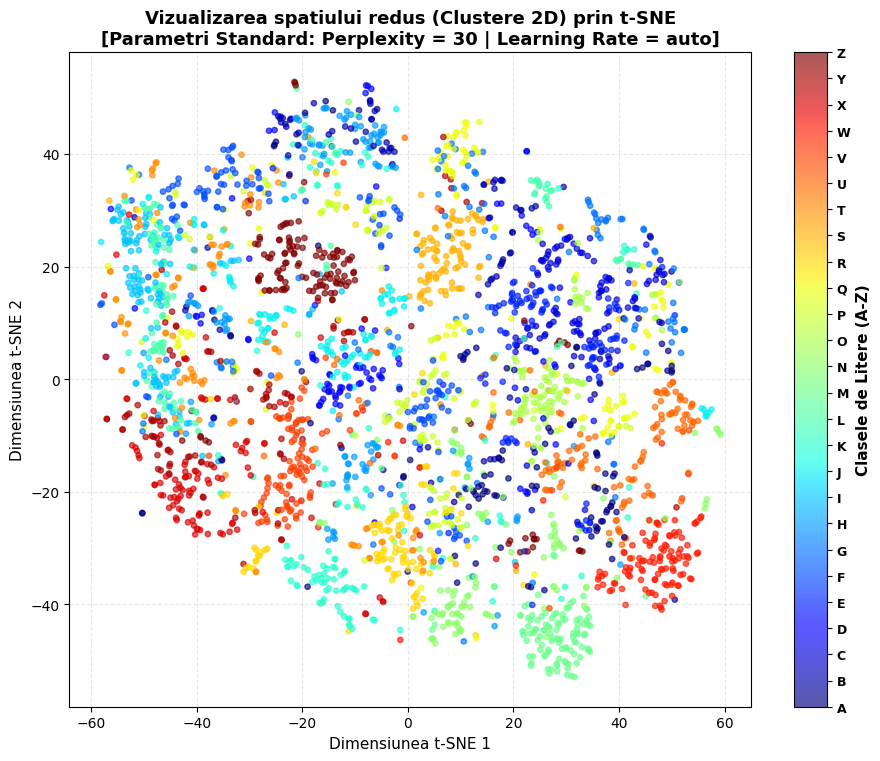

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

np.random.seed(42)
indici_tsne = np.random.choice(X_train_pca.shape[0], 3000, replace=False)
X_subset_pca = X_train_pca[indici_tsne]
y_subset_tsne = y_train[indici_tsne]

tsne_simplu = TSNE(n_components=2, perplexity=30, learning_rate='auto', random_state=42, max_iter=1000)
X_tsne_simplu = tsne_simplu.fit_transform(X_subset_pca)

plt.figure(figsize=(11, 8.5))
scatter = plt.scatter(X_tsne_simplu[:, 0], X_tsne_simplu[:, 1], c=y_subset_tsne, cmap='jet', alpha=0.65, s=15)

class_names = [chr(i + ord('A')) for i in range(26)]
cbar = plt.colorbar(scatter, ticks=range(26))
cbar.ax.set_yticklabels(class_names, fontsize=9, fontweight='bold')
cbar.set_label('Clasele de Litere (A-Z)', fontsize=11, fontweight='bold')

plt.title('Vizualizarea spatiului redus (Clustere 2D) prin t-SNE\n[Parametri Standard: Perplexity = 30 | Learning Rate = auto]',
          fontsize=13, fontweight='bold')
plt.xlabel('Dimensiunea t-SNE 1', fontsize=11)
plt.ylabel('Dimensiunea t-SNE 2', fontsize=11)
plt.grid(True, linestyle='--', alpha=0.3)
plt.show()

## Experimentarea Hiperparametrilor t-SNE și Analiza Impactului Acestora

Analiza vizuală a matricei de experimente ($4 \times 3$ combinații între `perplexity` și `learning_rate`) ne oferă o înțelegere clară a modului în care hiperparametrii structurali guvernează procesul de optimizare probabilistică și descurcarea topologică a setului de date EMNIST Letters.

### Impactul Parametrului Perplexity

Parametrul `perplexity` dictează în mod direct numărul de vecini imediați pe care algoritmul îi ia în considerare atunci când estimează densitatea probabilistică a datelor în spațiul multidimensional. În gridul obținut, variația sa produce efecte majore:

* **La Perplexity = 5 (Valoare mică):** Se observă un fenomen clar de **hiper-fragmentare**. Clusterele aferente aceleiași litere se sparg într-o multitudine de micro-clustere punctiforme împrăștiate pe ecran. Deoarece algoritmul este forțat să se concentreze doar pe vecinătăți extrem de restrânse (5 puncte), el ignoră complet structura macroscopică a claselor. Informația globală este pierdută în favoarea zgomotului statistic local, făcând vizualizarea granulară și ineficientă pentru separarea globală a claselor.

* **La Perplexity = 30 (Valoarea optimă):** Se atinge **echilibrul ideal**. Punctele de aceeași culoare migrează împreună și se compactează în clustere coerente. Granițele dintre clase devin cele mai clare și mai bine definite din întreaga matrice, permițând cea mai bună identificare vizuală a claselor, cu cele mai puține suprapuneri între grupuri adiacente.

* **La Perplexity = 50 (Valoare mare):** Topologia tinde spre o **netezire globală parțială**. Clusterele devin mai rotunjite și mai concentrate, însă granițele rămân acceptabile, cu o claritate ușor mai redusă față de perplexity=30, fără degradare majoră. Se observă de asemenea o ușoară tendință de comprimare a clusterelor spre centrul graficului față de valoarea optimă.

* **La Perplexity = 100 (Valoare extrem de mare):** Se instalează un fenomen sever de **contopire structurală**. Algoritmul pune un accent exagerat pe macro-structură în raport cu dimensiunea subsetului, ceea ce forțează grupuri diferite de litere să se amestece aleator. Clusterele se comprimă masiv spre nucleul graficului, suprapunerile cromatice devin frecvente și identitatea vizuală a fiecărei clase este în mare parte distrusă.

### Impactul Parametrului Learning Rate (Rata de Învățare)

Rata de învățare (`learning_rate`) controlează pasul de actualizare al pozițiilor punctelor în timpul optimizării prin gradient descent:

* **La Learning Rate = 50 (Valoare mică)**: Pașii de optimizare sunt mici, ceea ce face ca algoritmul să conveargă mai lent și să rămână parțial blocat în configurații suboptime. Graficele din prima coloană arată clustere ușor mai comprimate și mai puțin distanțate între ele față de varianta optimă, însă diferența nu este dramatică, structura generală rămâne recognoscibilă.
* **La Learning Rate = auto (Valoarea optimă)**: Această valoare asigură pași de optimizare echilibrați, permitând algoritmului să separe eficient clusterele fără a le comprima sau dispersa excesiv. Coloana centrală oferă cea mai bună combinație între coeziunea intra-cluster și distanța inter-cluster.
* **La Learning Rate = 500 (Valoare mare)**: Pașii de optimizare sunt prea mari, algoritmul "sare" peste configurații bune și clusterele devin excesiv de dispersate. Coeziunea intra-cluster scade vizibil, punctele aceleiași clase sunt mai răspândite în spațiu față de coloana centrală, chiar dacă distanța globală dintre grupuri pare mai mare.

---

### Concluzii și Recomandări Structurale

* **Validarea Configurației Optime:** Experimentul confirmă în mod empiric că intersecția dintre `perplexity = 30` și `learning_rate = 'auto'` reprezintă alegerea ideală pentru setul de date EMNIST Letters. Această combinație previne atât fărâmițarea locală cauzată de perplexitate prea mică, cât și contopirea structurală de la perplexitate prea mare, menținând totodată un pas de optimizare echilibrat.

* **Sensibilitatea Algoritmului:** S-a demonstrat că t-SNE este o metodă extrem de dinamică și sensibilă. Modificarea hiperparametrilor săi poate altera radical geometria și puritatea spațiului redus, transformând clustere bine delimitate în blocuri amestecate, fapt ce impune testarea sistematică a acestor parametri în orice proiect de analiză a datelor.

* **Decizia pentru Etapele Următoare:** Deși t-SNE configurat optim oferă o descurcare non-liniară excelentă în 2D, limitările sale legate de complexitatea computațională O(N²) fac impractică aplicarea globală pe întregul dataset fără eșantionare. Acest comportament fundamentează necesitatea introducerii algoritmului UMAP în secțiunea următoare, care va încerca să ofere o separare la fel de compactă, dar cu o păstrare superioară a relațiilor globale și la o viteză mult mai mare.

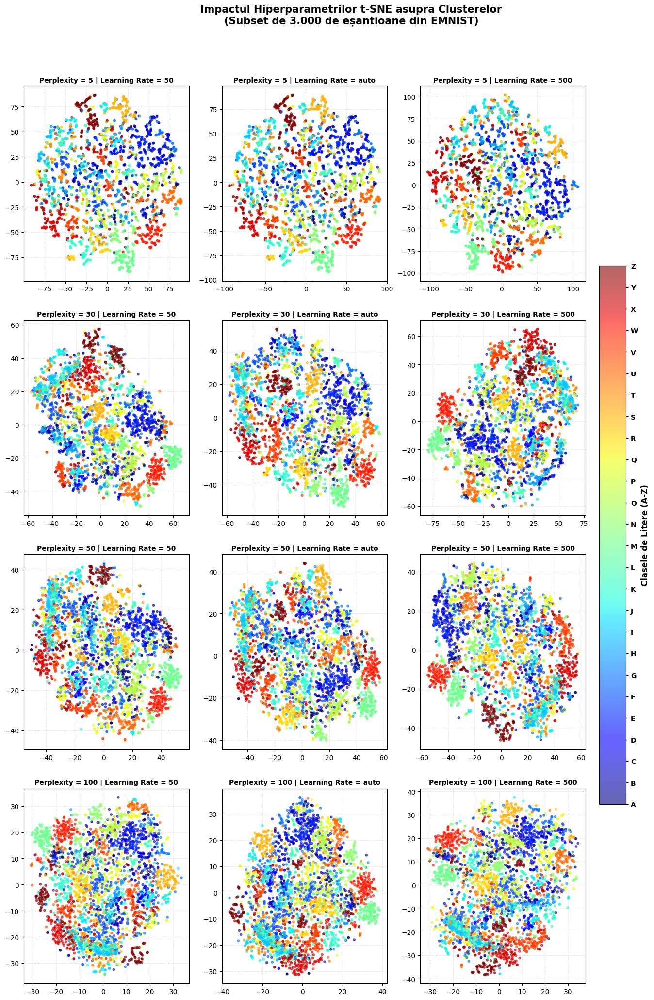

In [ ]:
from sklearn.manifold import TSNE

np.random.seed(42)
indici_tsne = np.random.choice(X_train_pca.shape[0], 3000, replace=False)

X_subset_pca = X_train_pca[indici_tsne]
y_subset_tsne = y_train[indici_tsne]

valori_perplexity = [5, 30, 50, 100]
valori_lr = [50, 'auto', 500]

fig, axes = plt.subplots(len(valori_perplexity), len(valori_lr), figsize=(18, 24))

for r, perp in enumerate(valori_perplexity):
    for c, lr in enumerate(valori_lr):

        tsne = TSNE(n_components=2, perplexity=perp, learning_rate=lr, random_state=42, max_iter=1000)
        X_embedding = tsne.fit_transform(X_subset_pca)
        ax = axes[r, c]

        scatter = ax.scatter(X_embedding[:, 0], X_embedding[:, 1], c=y_subset_tsne, cmap='jet', alpha=0.6, s=10)

        ax.set_title(f"Perplexity = {perp} | Learning Rate = {lr}", fontsize=10, fontweight='bold')
        ax.grid(True, linestyle=':', alpha=0.5)
        ax.axis('on')

class_names = [chr(i + ord('A')) for i in range(26)]
cbar = fig.colorbar(scatter, ax=axes.ravel().tolist(), ticks=range(26), shrink=0.6, pad=0.02)
cbar.ax.set_yticklabels(class_names, fontsize=10, fontweight='bold')
cbar.set_label('Clasele de Litere (A-Z)', fontsize=12, fontweight='bold')

plt.suptitle("Impactul Hiperparametrilor t-SNE asupra Clusterelor\n(Subset de 3.000 de eșantioane din EMNIST)",
             fontsize=15, fontweight='bold', y=0.95)

plt.show()

# 4. Reducerea Dimensionalitatii cu UMAP

## Explicarea Metodei UMAP

**UMAP (Uniform Manifold Approximation and Projection)** este o metodă modernă de reducere a dimensionalității care funcționează prin construirea unui graf complex ce descrie structura geometrică a datelor în spațiul inițial multidimensional. Ulterior, algoritmul proiectează punctele într-un spațiu redus, de obicei bidimensional, și optimizează acest nou graf pentru a fi cât mai asemănător structural cu cel original. La fel ca t-SNE, scopul său principal este să păstreze atât relațiile locale dintre punctele apropiate, cât și structura globală a setului de date. Totuși, UMAP realizează acest proces mult mai rapid din punct de vedere computațional și tinde să fie mult mai eficient în conservarea macro-structurii, adică în reflectarea corectă a distanțelor și a modului în care clusterele diferite se raportează unele la celelalte pe grafic.

### Hiperparametrii Fundamentali:
* **`n_neighbors` (Numărul de vecini):** Controlează echilibrul dintre structura locală și cea globală. Valori mici forțează algoritmul să se concentreze pe detalii geometrice foarte fine (stiluri de scriere), în timp ce valori mari prioritizează macro-structura (relațiile globale dintre litere diferite).
* **`min_dist` (Distanța minimă):** Determină cât de aproape au voie punctele să fie așezate în spațiul 2D. Valori apropiate de $0.0$ permit clusterizări extrem de dense, în timp ce valori mari dispersează punctele, generând o distribuție mai aerisită.

In [ ]:
!pip install umap-learn -q

## Interpretarea Vizualizării UMAP

Proiecția UMAP cu configurația implicită (`n_neighbors = 15`, `min_dist = 0.1`) pe subsetul de 3.000 de eșantioane produce o reprezentare structurală comparabilă cu cea mai bună configurație t-SNE testată anterior.

### Morfologia și Compactitatea Clusterelor
Unele clase formează grupuri relativ bine delimitate, vizibile în special la extremitățile graficului, unde culorile închise (albastru-închis jos, roșu-închis dreapta sus) ocupă regiuni distincte. Totuși, multe dintre cele 26 de clase rămân difuze, fără granițe clare, punctele aceleiași litere fiind distribuite în zone largi care se suprapun parțial cu clasele vecine.

### Conservarea Macro-Structurii Globale
O proprietate vizibilă a UMAP față de t-SNE este păstrarea parțială a relațiilor globale. Distribuția spațială nu este haotică, există un gradient cromatic coerent de la albastru la roșu care urmează o structură topologică, sugerând că literele cu trăsături geometrice similare tind să fie proiectate în regiuni apropiate ale planului 2D.

### Zone de Ambiguitate
Se observă puncte izolate din clase diferite intercalate pe tot spațiul proiecției, fără o zonă centrală distinctă de amestec. Acest comportament reflectă eșantioanele scrise ambiguu sau neglijent, unde distincția vizuală dintre anumite litere este dificilă chiar și pentru un observator uman.

**Concluzie:** Rularea de bază confirmă că UMAP produce o structură vizuală utilă cu parametrii impliciți. Avantajul său principal față de t-SNE nu este neapărat vizibil pe un subset de 3.000 de puncte, ci constă în scalabilitatea superioară și capacitatea de a fi aplicat pe întregul dataset. În celula următoare vom analiza impactul hiperparametrilor `n_neighbors` și `min_dist` pentru a evalua dacă separarea poate fi îmbunătățită suplimentar.

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


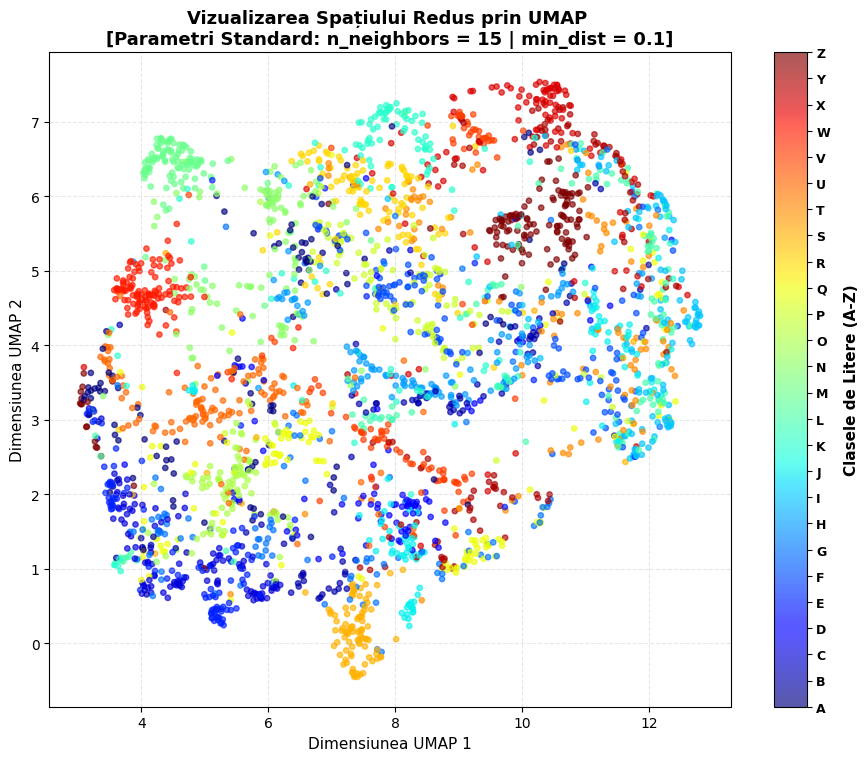

In [ ]:
import umap

X_subset_umap = X_subset_pca
y_subset_umap = y_subset_tsne

umap_baseline = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
X_umap_baseline = umap_baseline.fit_transform(X_subset_umap)

plt.figure(figsize=(11, 8.5))
scatter_umap = plt.scatter(X_umap_baseline[:, 0], X_umap_baseline[:, 1],
                           c=y_subset_umap, cmap='jet', alpha=0.65, s=15)

class_names = [chr(i + ord('A')) for i in range(26)]
cbar = plt.colorbar(scatter_umap, ticks=range(26))
cbar.ax.set_yticklabels(class_names, fontsize=9, fontweight='bold')
cbar.set_label('Clasele de Litere (A-Z)', fontsize=11, fontweight='bold', labelpad=10)

plt.title('Vizualizarea Spațiului Redus prin UMAP \n[Parametri Standard: n_neighbors = 15 | min_dist = 0.1]',
          fontsize=13, fontweight='bold')
plt.xlabel('Dimensiunea UMAP 1', fontsize=11)
plt.ylabel('Dimensiunea UMAP 2', fontsize=11)
plt.grid(True, linestyle='--', alpha=0.3)
plt.show()

## Analiza Efectului Parametrilor asupra Clusterelor (UMAP)

Matricea de experimente (3 valori pentru `n_neighbors` × 3 valori pentru `min_dist`) ilustrează modul în care cei doi hiperparametri controlează structura spațiului redus pentru setul de date EMNIST Letters.

### 1. Analiza Parametrului `n_neighbors` (Evoluția pe Rânduri: 5 → 15 → 50)

* **La `n_neighbors = 5` (Rândul de sus):** Se observă o **fragmentare structurală pronunțată**. Punctele aceleiași clase nu formează blocuri unitare, ci se organizează în filamente subțiri, arcuri și micro-grupuri dispersate cu spații mari de gol între ele. Structura globală a celor 26 de clase este greu de identificat, algoritmul concentrându-se excesiv pe vecinătăți ultra-locale.

* **La `n_neighbors = 15` (Rândul din mijloc):** Se atinge **echilibrul optim**. Fragmentarea din rândul anterior se reduce vizibil iar clasele încep să formeze regiuni mai coerente și mai compacte. Granițele dintre clustere sunt mai clare față de `n_neighbors = 5`, iar structura globală a alfabetului devine recognoscibilă, cu coridoare de spațiu gol între clase.

* **La `n_neighbors = 50` (Rândul de jos):** Focusul se mută spre **macro-structură globală**. Clusterele devin mai masive și mai continue, însă coeziunea internă scade iar punctele aceleiași clase sunt distribuite în regiuni mai largi și mai difuze. Separabilitatea dintre clase se degradează față de `n_neighbors = 15`, clasele cu geometrii similare începând să se suprapună.

---

### 2. Analiza Parametrului `min_dist` (Evoluția pe Coloane: 0.0 → 0.1 → 0.5)

* **La `min_dist = 0.0` (Coloana din stânga):** Punctele sunt comprimate la maximum. Clusterele apar ca filamente dense și arcuri compacte, cu zone mari de spațiu alb între ele. Structura e clară local, dar fragmentată și neuniformă ca distribuție spațială.

* **La `min_dist = 0.1` (Coloana din mijloc):** Reprezintă **compromisul vizual cel mai echilibrat**. Clusterele sunt suficient de compacte pentru a fi identificabile, dar suficient de aerisite pentru a lăsa granițe vizibile între clase. Distribuția spațială este mai uniformă față de `min_dist = 0.0`, fără filamente extreme sau mase difuze.

* **La `min_dist = 0.5` (Coloana din dreapta):** Distribuția devine **excesiv de difuză**. Clusterele se extind pe suprafețe mari, marginile claselor diferite se ating și se suprapun frecvent, iar identitatea cromatică a fiecărei clase devine greu de urmărit. Separabilitatea globală este cea mai slabă din întreaga matrice.

---

### Concluzia Experimentului UMAP

Analiza gridului confirmă că valorile standard (`n_neighbors = 15`, `min_dist = 0.1`) reprezintă hiperparametrii optimi pentru vizualizarea EMNIST Letters. Această combinație evită atât fragmentarea excesivă de la `n_neighbors` mic, cât și pierderea granițelor dintre clase cauzată de `min_dist` mare.

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr

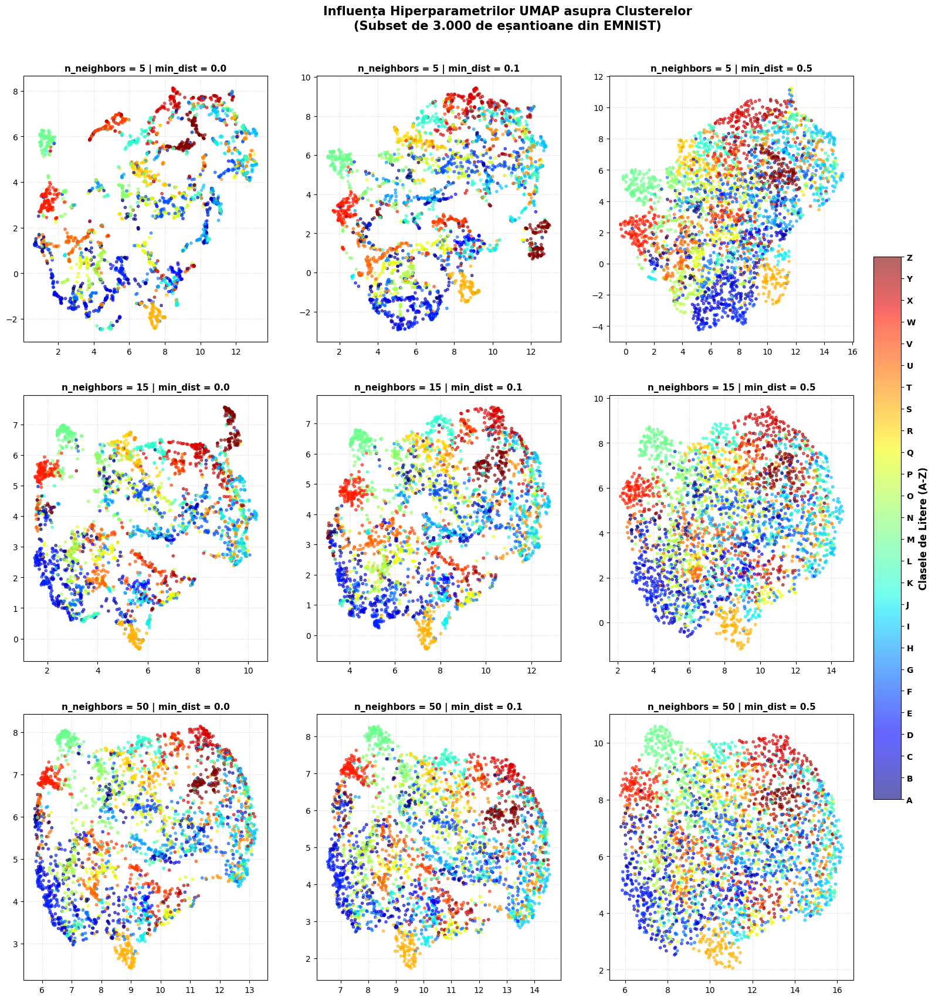

In [ ]:
valori_neighbors = [5, 15, 50]
valori_dist = [0.0, 0.1, 0.5]

fig, axes = plt.subplots(len(valori_neighbors), len(valori_dist), figsize=(22, 20))

for r, nn in enumerate(valori_neighbors):
    for c, md in enumerate(valori_dist):

        umap_exp = umap.UMAP(n_neighbors=nn, min_dist=md, random_state=42)
        X_embedding_umap = umap_exp.fit_transform(X_subset_umap)

        ax = axes[r, c]
        scatter_exp = ax.scatter(X_embedding_umap[:, 0], X_embedding_umap[:, 1],
                                 c=y_subset_umap, cmap='jet', alpha=0.6, s=10)

        ax.set_title(f"n_neighbors = {nn} | min_dist = {md}", fontsize=11, fontweight='bold')
        ax.grid(True, linestyle=':', alpha=0.5)

cbar = fig.colorbar(scatter_exp, ax=axes.ravel().tolist(), ticks=range(26), shrink=0.6, pad=0.02)
cbar.ax.set_yticklabels(class_names, fontsize=10, fontweight='bold')
cbar.set_label('Clasele de Litere (A-Z)', fontsize=12, fontweight='bold')

plt.suptitle("Influența Hiperparametrilor UMAP asupra Clusterelor\n(Subset de 3.000 de eșantioane din EMNIST)",
             fontsize=15, fontweight='bold', y=0.94)
plt.show()

## Compararea UMAP cu PCA și t-SNE

După aplicarea algoritmului UMAP pe subsetul de 3.000 de eșantioane, putem realiza o analiză comparativă directă cu celelalte două tehnici implementate anterior.

### 1. Compararea UMAP cu PCA (Abordare Non-Liniară vs. Liniară)

* **Capacitatea de descurcare a spațiului:** PCA este un algoritm strict liniar care caută axele de varianță maximă. Deoarece caracterele scrise de mână conțin relații complexe și non-liniare între pixeli, proiecția PCA în 2D a reținut doar 16.11% din informația totală, colapsând datele într-un nor central opac unde cele 26 de clase sunt complet suprapuse și inseparabile vizual. UMAP, în schimb, modelează structura locală a datelor ca pe o varietate curbă, permițându-i să descopere relații pe care PCA le ignoră prin natura sa liniară. Rezultatul este transformarea acelui nor amestecat într-o hartă de clustere distincte cu granițe vizibile între clase.

* **Obiectivul optimizării:** PCA reduce dimensiunea prin rotații matematice ale axelor, fără a ține cont de structura internă a claselor. UMAP caută să păstreze relațiile de proximitate dintre puncte, ceea ce face ca embedding-ul său vizual să fie net superior din punct de vedere al separabilității claselor.

---

### 2. Compararea UMAP cu t-SNE (Abordare Topologică vs. Probabilistică)

Ambii algoritmi sunt non-liniari și produc vizualizări 2D utile, însă UMAP aduce câteva îmbunătățiri concrete față de t-SNE:

* **Morfologia clusterelor:** t-SNE, prin focusul său probabilistic local, a produs în experimentele noastre clustere comprimate sau difuze în funcție de hiperparametri, cu sensibilitate mare la valorile alese. UMAP cu parametrii optimi (`n_neighbors = 15`, `min_dist = 0.1`) produce clustere mai stabile și mai coerente, cu granițe mai clare între clase și mai puțin dependente de tuning fin.

* **Păstrarea macro-structurii globale:** În t-SNE, distanțele mari dintre clustere reflectă doar optimizarea locală și nu au interpretare globală directă. În UMAP, pozițiile relative ale clusterelor păstrează parțial structura metrică a spațiului original. Clasele cu trăsături geometrice similare tind să fie proiectate în regiuni apropiate ale planului 2D.

* **Eficiența computațională și scalabilitatea:** t-SNE are complexitate $O(N^2)$, ceea ce a impus limitarea la 3.000 de eșantioane în toate experimentele anterioare. UMAP operează la complexitate $O(N \log N)$, făcându-l semnificativ mai rapid și capabil să scaleze pe volume mai mari de date, acesta fiind avantajul principal față de t-SNE în contextul unui dataset complet precum EMNIST.

# 5. Vizualizare și Interpretare — Comparison of Results

Această secțiune este dedicată analizei comparative a celor trei spații reduse bidimensionale obținute prin PCA, t-SNE și UMAP. Folosind un subset identic de 3.000 de eșantioane distribuit pe cele 26 de clase ale alfabetului (A-Z), evaluăm calitativ capacitatea fiecărui algoritm de a descurca topologia pixelilor din imagini.

---

## 1. Evidențierea Separării Claselor (Analiză Empirică pe EMNIST)

Privind panoul comparativ triplu, se observă o evoluție clară a modului în care punctele de aceeași culoare se organizează în spațiul 2D:

* **În spațiul PCA:** Separarea claselor este practic **inexistentă**. Cele 26 de clase sunt complet suprapuse într-un nor eliptic central, fără nicio structură recognoscibilă. Frontierele de decizie sunt imposibil de trasat în 2D, ceea ce confirmă limitarea fundamentală a proiecției liniare pe date cu variații caligrafice complexe.

* **În spațiul t-SNE:** Norul amestecat din PCA este descurcat vizibil. Clasele se separă în grupuri relativ distincte, cu regiuni cromatice recognoscibile și coridoare de spațiu gol între ele. Centrul graficului rămâne parțial aglomerat din cauza literelor cu forme similare sau scrise neglijent, însă separabilitatea globală este net superioară față de PCA.

* **În spațiul UMAP:** Se obține cea mai curată separare din cele trei. Clasele formează grupuri mai compacte și mai bine delimitate față de t-SNE, cu granițe mai clare între regiunile cromatice. Distribuția spațială este mai uniformă, iar coridoarele de spațiu gol dintre clase sunt mai consistente.

---

## 2. Comparison of Results (Avantaje, Limitări și Comportament pe EMNIST)

### Principal Component Analysis (PCA)
* **✅ Avantaje:**
    * **Viteză și Eficiență:** Cel mai rapid algoritm implementat, rulând în timp liniar în raport cu numărul de eșantioane.
    * **Determinism și Interpretare:** Componentele principale sunt stabile și au semnificație algebrică directă, sunt axele ortogonale de varianta maximă din date.
* **❌ Dezavantaje:**
    * **Presupunerea de Liniaritate:** Poate capta doar corelații liniare. Formele curbate ale scrisului de mână sunt intrinsec non-liniare, motiv pentru care PCA nu le poate separa.
    * **Pierdere Masivă de Informație în 2D:** Proiecția bidimensională reține doar **16.11%** din varianța totală, peste 83% din structura geometrică fiind pierdută.
* **Comportamentul pe EMNIST Letters:** PCA eșuează vizual — toate cele 26 de clase colapsează într-un singur nor compact și inseparabil. Algoritmul rămâne însă util ca etapă de preprocesare, comprimând datele de la 784 la 68 de dimensiuni cu 90% din varianță păstrată.

### t-Distributed Stochastic Neighbor Embedding (t-SNE)
* **✅ Avantaje:**
    * **Conservare Locală de Înaltă Fidelitate:** Eficient în păstrarea structurilor non-liniare din vecinătățile restrânse.
    * **Separabilitate Vizibilă:** Reușește să despartă cele 26 de clase în regiuni distincte, transformând complet norul amestecat din PCA.
* **❌ Dezavantaje:**
    * **Cost Computațional Ridicat:** Complexitate $O(N^2)$, necesitând eșantionare la 3.000 de puncte pentru timpi rezonabili.
    * **Sensibilitate la Hiperparametri:** Calitatea rezultatelor variază semnificativ în funcție de `perplexity` și `learning_rate`, necesitând tuning sistematic.
    * **Distorsionarea Structurii Globale:** Distanțele mari dintre clustere pe ecran nu au interpretare geometrică directă.
* **Comportamentul pe EMNIST Letters:** t-SNE produce o separare vizuală utilă cu parametrii optimi (`perplexity = 30`, `learning_rate = auto`), însă clusterele sunt mai puțin compacte și mai sensibile la configurație față de UMAP.

### Uniform Manifold Approximation and Projection (UMAP)
* **✅ Avantaje:**
    * **Scalabilitate și Viteză:** Complexitate $O(N \log N)$, semnificativ mai rapid decât t-SNE pe volume mari de date.
    * **Stabilitate:** Produce rezultate consistente cu variații mai mici la schimbarea hiperparametrilor față de t-SNE.
    * **Compactitate Superioară:** Clusterele sunt mai dense și mai bine delimitate față de t-SNE cu aceiași parametri standard.
* **❌ Dezavantaje:**
    * **Natură Stochastică:** Așezarea generală depinde de `random_state` setat.
    * **Complexitate Teoretică:** Fundamentul său matematic face mecanismul intern mai greu de interpretat.
* **Comportamentul pe EMNIST Letters:** UMAP oferă cea mai bună reprezentare vizuală din cele trei tehnici testate, cu clustere mai compacte și granițe mai clare între clase față de t-SNE, menținând totodată o structură globală coerentă a spațiului redus.

---

## 3. Sinteză Comparativă (PCA vs. t-SNE vs. UMAP)

Ambele metode non-liniare surclasează PCA în ceea ce privește separabilitatea vizuală a claselor. Dintre cele două, **UMAP se afirmă ca soluția optimă pentru vizualizarea finală**, combinând compactitatea clusterelor cu stabilitatea la hiperparametri și eficiența computațională superioară.

PCA rămâne însă indispensabil ca etapă de preprocesare, comprimând datele de la 784 la 68 de dimensiuni cu 90% din varianță păstrată, generează o matrice optimizată ce reduce riscul de overfitting și timpul de antrenare pentru modelele de clasificare din secțiunile următoare.

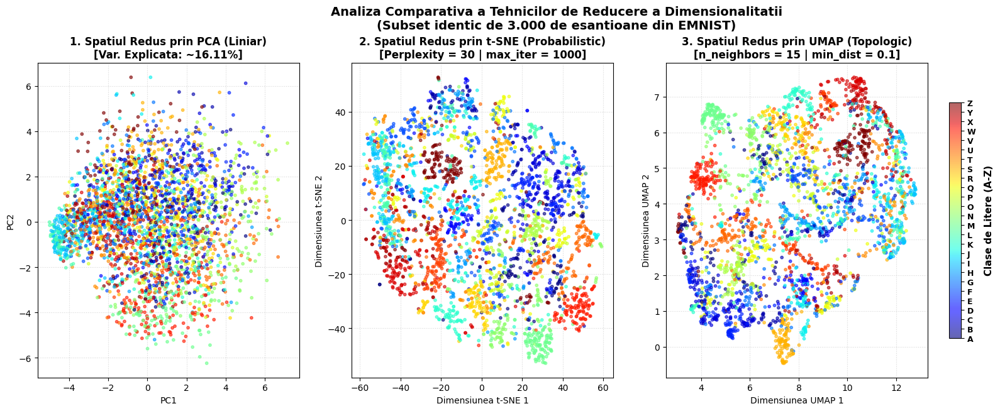

In [ ]:
X_subset_pca_2d = X_train_pca_2d[indici_tsne]

fig, axes = plt.subplots(1, 3, figsize=(22, 6.5))
class_names = [chr(i + ord('A')) for i in range(26)]

scatter_pca = axes[0].scatter(X_subset_pca_2d[:, 0], X_subset_pca_2d[:, 1], c=y_subset_tsne, cmap='jet', alpha=0.6, s=10)
axes[0].set_title("1. Spatiul Redus prin PCA (Liniar)\n[Var. Explicata: ~16.11%]", fontsize=12, fontweight='bold')
axes[0].set_xlabel("PC1")
axes[0].set_ylabel("PC2")
axes[0].grid(True, linestyle=':', alpha=0.5)

scatter_tsne = axes[1].scatter(X_tsne_simplu[:, 0], X_tsne_simplu[:, 1], c=y_subset_tsne, cmap='jet', alpha=0.6, s=10)
axes[1].set_title("2. Spatiul Redus prin t-SNE (Probabilistic)\n[Perplexity = 30 | max_iter = 1000]", fontsize=12, fontweight='bold')
axes[1].set_xlabel("Dimensiunea t-SNE 1")
axes[1].set_ylabel("Dimensiunea t-SNE 2")
axes[1].grid(True, linestyle=':', alpha=0.5)

scatter_umap = axes[2].scatter(X_umap_baseline[:, 0], X_umap_baseline[:, 1], c=y_subset_tsne, cmap='jet', alpha=0.6, s=10)
axes[2].set_title("3. Spatiul Redus prin UMAP (Topologic)\n[n_neighbors = 15 | min_dist = 0.1]", fontsize=12, fontweight='bold')
axes[2].set_xlabel("Dimensiunea UMAP 1")
axes[2].set_ylabel("Dimensiunea UMAP 2")
axes[2].grid(True, linestyle=':', alpha=0.5)

cbar = fig.colorbar(scatter_umap, ax=axes.tolist(), ticks=range(26), shrink=0.75, pad=0.02)
cbar.ax.set_yticklabels(class_names, fontsize=9, fontweight='bold')
cbar.set_label('Clase de Litere (A-Z)', fontsize=11, fontweight='bold', labelpad=10)

plt.suptitle("Analiza Comparativa a Tehnicilor de Reducere a Dimensionalitatii\n(Subset identic de 3.000 de esantioane din EMNIST)",
             fontsize=14, fontweight='bold', y=1.02)
plt.show()

# 6. Antrenarea unei Rețele Neuronale pentru Clasificare

În această secțiune antrenăm o rețea neuronală densă (Fully Connected / MLP)
pe spațiul PCA redus (68 componente, 90% varianță păstrată) pentru clasificarea
celor 26 de litere din EMNIST Letters.

Pipeline-ul urmează structura:
1. Pregătirea datelor (scalare + split validare)
2. Definirea arhitecturii baseline
3. Antrenare cu callbacks (EarlyStopping + ModelCheckpoint)
4. Optimizare hiperparametri cu RandomizedSearchCV
5. Evaluare finală și vizualizare rezultate

### Pregătirea Datelor pentru Rețeaua Neuronală

**Împărțirea în seturi de antrenare și validare:**
Setul de antrenare este împărțit în proporție de 90%/10% folosind `train_test_split`
cu `stratify=y_train` — aceasta garantează că fiecare dintre cele 26 de clase este
reprezentată proporțional atât în setul de antrenare cât și în cel de validare,
evitând dezechilibre de distribuție.

**Scalarea datelor:**
Se aplică `MinMaxScaler` pentru a normaliza toate caracteristicile în intervalul [0, 1].
Este esențial ca scalerul să fie aplicat **doar pe datele de antrenare** (`fit_transform`)
și aplicat ulterior pe validare și test (`transform`), pentru a preveni data leakage, adică
situația în care informații din setul de test influențează preprocesarea.

**Structura finală a datelor:**

| Set | Shape | Descriere |
|---|---|---|
| `X_tr_scaled` | (79.920, 68) | Date de antrenare — 90% din train original |
| `X_val_scaled` | (8.880, 68) | Date de validare — 10% din train original |
| `X_test_scaled` | (14.800, 68) | Date de test — setul oficial EMNIST Letters |

Toate cele 26 de clase sunt prezente în setul de antrenare, confirmând că
`stratify` a funcționat corect. Fiecare exemplu este reprezentat prin 68 de
componente PCA în loc de cei 784 de pixeli originali, reducând dimensionalitatea
cu ~91% față de spațiul inițial.

In [ ]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

X_tr, X_val, y_tr, y_val = train_test_split(
    X_train_pca, y_train,
    test_size=0.1, random_state=42, stratify=y_train
)

scaler_nn = MinMaxScaler()
X_tr_scaled   = scaler_nn.fit_transform(X_tr)
X_val_scaled  = scaler_nn.transform(X_val)
X_test_scaled = scaler_nn.transform(X_test_pca)

print(f"Train:     {X_tr_scaled.shape}")
print(f"Validare:  {X_val_scaled.shape}")
print(f"Test:      {X_test_scaled.shape}")
print(f"Nr. clase: {len(np.unique(y_tr))}")

Train:     (79920, 68)
Validare:  (8880, 68)
Test:      (14800, 68)
Nr. clase: 26


## Definirea Arhitecturii Modelului Baseline (Multi-Layer Perceptron)

Această etapă este dedicată construirii primei rețele neuronale dense (Fully Connected / MLP), care va servi drept punct de referință (baseline) pentru performanța clasificării literelor din setul EMNIST.

### Inițializarea și Asigurarea Reproductibilității

Înainte de a defini straturile rețelei, codul execută trei instrucțiuni esențiale pentru controlul mediului de calcul:
* **`keras.backend.clear_session()`:** Șterge starea globală internă a Keras și eliberează memoria graficului computațional anterior. Acest pas previne acumularea modelelor vechi în memorie și evită conflictele de denumire a straturilor în cazul rulărilor repetate ale aceleiași celule.
* **`np.random.seed(42)` și `tf.random.set_seed(42)`:** Fixează generatorul de numere aleatoare atât pentru NumPy, cât și pentru TensorFlow. Acest lucru garantează că inițializarea ponderilor straturilor va fi identică la fiecare rulare, asigurând o reproductibilitate completă a experimentelor.

### Structura Straturilor și Logica Arhitecturii

Modelul este construit folosind API-ul `Sequential`, unind straturile într-o structură liniară, de tip stivă:

* **Stratul de Intrare (`Input`):** Primește vectori cu forma `(68,)`, corespunzători celor 68 de coordonate obținute în urma reducerii dimensionalității prin PCA.
* **Primul Strat Ascuns (`Dense` - 256 neuroni):** Un strat complet conectat cu 256 de unități. Folosește funcția de activare **ReLU** (Rectified Linear Unit) pentru a introduce non-liniaritate în rețea, permițându-i să învețe relații complexe între componentele PCA.
* **Al Doilea Strat Ascuns (`Dense` - 128 neuroni):** Un strat intermediar cu 128 de unități și activare **ReLU**, menit să condenseze și să combine trăsăturile extrase de primul strat în reprezentări de nivel mai înalt.
* **Stratul de Ieșire (`Dense` - 26 neuroni):** Stratul final conține exact 26 de neuroni, câte unul pentru fiecare literă a alfabetului (A-Z). Utilizează funcția de activare **Softmax**, care transformă valorile brute ale rețelei (scorurile logit) într-o distribuție de probabilități, a cărei sumă este egală cu 1 (fiecare clasă primește o probabilitate de certitudine).

### Analiza Tabelară a Parametrilor (Model Summary)

Rezumatul arhitecturii arată modul în care sunt distribuiți cei **53.914 parametri antrenabili** (ponderi și biases) în interiorul rețelei:

| Tip Strat | Formă Ieșire (Output Shape) | Număr Parametri (Param #) | Formula de Calcul a Ponderilor |
| :--- | :--- | :--- | :--- |
| **Input Layer** | `(None, 68)` | 0 | Fără parametri de antrenat |
| **Dense (Hidden 1)** | `(None, 256)` | 17,664 | $(68 \text{ intrări} \times 256 \text{ neuroni}) + 256 \text{ biases}$ |
| **Dense_1 (Hidden 2)** | `(None, 128)` | 32,896 | $(256 \text{ intrări} \times 128 \text{ neuroni}) + 128 \text{ biases}$ |
| **Dense_2 (Output)** | `(None, 26)` | 3,354 | $(128 \text{ intrări} \times 26 \text{ neuroni}) + 26 \text{ biases}$ |

Toți parametrii sunt marcați ca fiind antrenabili (`Trainable params`), ceea ce înseamnă că algoritmul de optimizare le va ajusta valorile în timpul procesului de învățare prin tehnica de backpropagation. La final, funcția `keras.utils.plot_model` salvează schema bloc structurală a rețelei cu tot cu formele vectorilor de intrare-ieșire pentru a asigura o documentare vizuală completă.

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 256)            │        17,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 26)             │         3,354 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 53,914 (210.60 KB)

 Trainable params: 53,914 (210.60 KB)

 Non-trainable params: 0 (0.00 B)

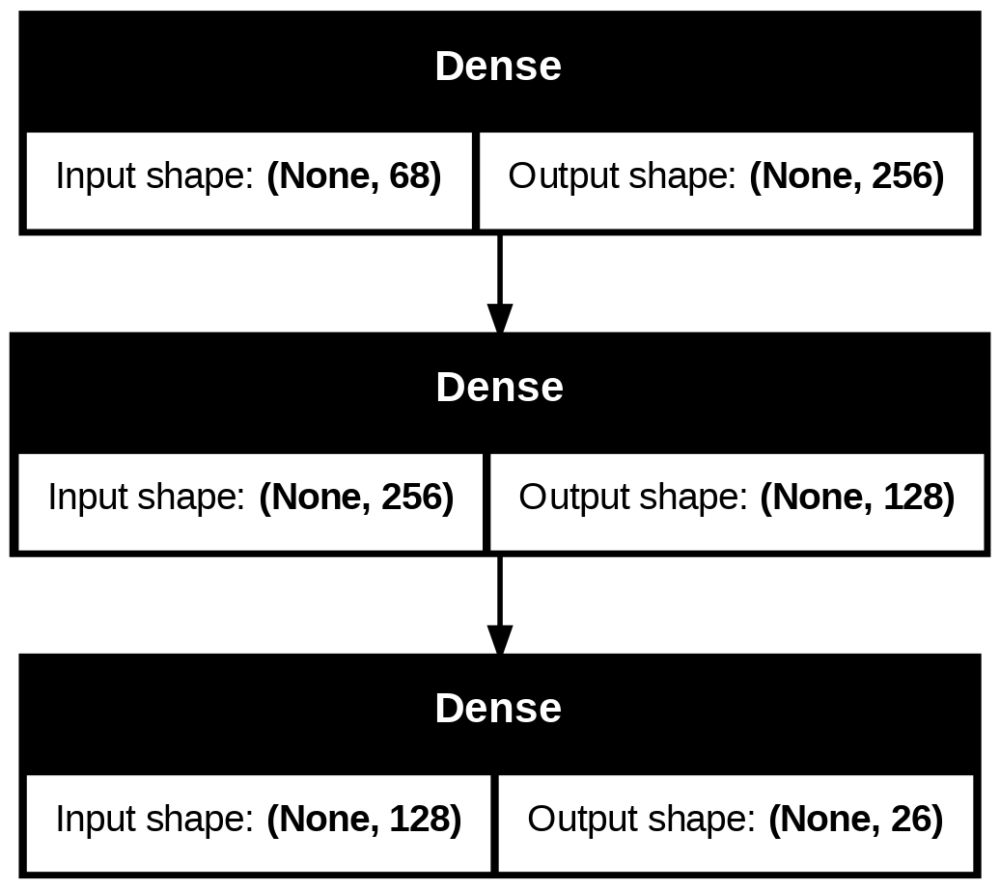

In [ ]:
keras.backend.clear_session()
np.random.seed(42)
tf.random.set_seed(42)

model_baseline = keras.models.Sequential([
    keras.layers.Input(shape=(X_tr_scaled.shape[1],)),
    keras.layers.Dense(256, activation='relu'),
    keras.layers.Dense(128, activation='relu'),
    keras.layers.Dense(26, activation='softmax')
])

model_baseline.summary()

keras.utils.plot_model(
    model_baseline,
    "model_baseline_emnist.png",
    show_shapes=True
)

## Inspecția Straturilor și Extragerea Parametrilor Geometrici

Această celulă verifică componentele interne ale rețelei `model_baseline` și validează dimensiunile matematice ale ponderilor de pe primul strat ascuns.

### Identificarea și Validarea Stratului
* **Accesarea programatică:** Prin proprietatea `.layers[0]` se izolează primul strat ascuns al rețelei, numit automat de Keras `"dense"`.
* **Validarea integrității:** Expresia `get_layer(...) is hidden1` întoarce `True`, confirmând că căutarea stratului după nume indică exact același obiect din memorie.

### Structura Matricilor de Ponderi (Weights & Biases)
Funcția `get_weights()` extrage parametrii pe care rețeaua îi va optimiza în timpul antrenării:
* **Matricea de Ponderi (`Weights shape: (68, 256)`):** Reflectă conexiunile de tip *fully-connected*. Arată că fiecare dintre cei 256 de neuroni de pe acest strat primește legături de la toate cele 68 de caracteristici de intrare (componentele PCA).
* **Vectorul de Biases (`Biases shape: (256,)`):** Fiecare dintre cei 256 de neuroni are alocat un singur termen de deplasare (bias) individual, adăugat înainte de aplicarea funcției de activare ReLU.

In [ ]:
model_baseline.layers

keras.utils.plot_model(model_baseline, "model_baseline_emnist.png", show_shapes=True)

hidden1 = model_baseline.layers[0]
print("Numele layerului:", hidden1.name)
print("Same layer?", model_baseline.get_layer(hidden1.name) is hidden1)

weights, biases = hidden1.get_weights()
print("Weights shape:", weights.shape)
print("Biases shape:", biases.shape)

Numele layerului: dense
Same layer? True
Weights shape: (68, 256)
Biases shape: (256,)


In [ ]:
weights

array([[ 0.07662602, -0.08129756,  0.00591385, ..., -0.00238352,
        -0.01535852, -0.00555076],
       [ 0.08713834,  0.13429257,  0.07290344, ..., -0.03096129,
         0.03111148,  0.03174184],
       [-0.00250603,  0.09726027,  0.00569151, ..., -0.04824021,
        -0.00618941, -0.12513341],
       ...,
       [ 0.03790821,  0.01139089, -0.07362413, ..., -0.02337994,
         0.04307649, -0.03862862],
       [-0.0649997 ,  0.05522363,  0.10052826, ...,  0.12835237,
        -0.05575002,  0.00434826],
       [-0.0861516 ,  0.10658756,  0.12997076, ...,  0.04479004,
        -0.08020467, -0.05534952]], dtype=float32)

In [ ]:
biases

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

## Compilarea și Antrenarea Modelului Baseline

În această etapă configurăm funcția de eroare, optimizatorul și mecanismele de siguranță (callbacks), apoi lansăm procesul de antrenare a rețelei pe parcursul a maximum 50 de epoci.

### Configurația Procesului de Învățare (Compilare)

* **Optimizatorul (`adam`):** Ajustează dinamic rata de învățare pentru fiecare parametru în parte, asigurând o convergență rapidă și stabilă fără a fi nevoie de calibrarea manuală a pasului.
* **Funcția de Loss (`sparse_categorical_crossentropy`):** Este alegerea ideală pentru clasificarea multiclasă atunci când etichetele sunt salvate sub formă de numere întregi (indici de la 0 la 25 pentru literele A-Z), eliminând necesitatea conversiei la formatul *one-hot encoding*.
* **Metrica (`accuracy`):** Monitorizează procentul de imagini clasificate corect în timpul antrenării și validării.

### Mecanisme de Monitorizare și Siguranță (Callbacks)

Pentru a proteja modelul și a eficientiza timpul de calcul, am integrat două funcții de control:
* **`ModelCheckpoint`:** Monitorizează setul de validare și salvează automat pe disc fișierul `best_model_baseline.keras` doar atunci când se obține o îmbunătățire a erorii, garantând că nu vom pierde cea mai bună stare a rețelei.
* **`EarlyStopping`:** Acționează ca o frână de siguranță împotriva suprantrenării (*overfitting*). Dacă eroarea pe setul de validare (`val_loss`) încetează să mai scadă timp de **10 epoci consecutive (patience=10)**, antrenarea este oprită automat, iar ponderile modelului sunt readuse la starea lor optimă (`restore_best_weights=True`).

### Analiza Performanței și Dinamica Antrenării

Rularea codului ne oferă indicii clare despre comportamentul rețelei în cele **48 de epoci** executate:
* **Activarea Early Stopping:** Antrenarea s-a oprit la epoca 48, deși limita maximă era de 50. Analizând logurile, cel mai mic `val_loss` a fost atins la **Epoca 38 (0.4351)**. Deoarece în următoarele 10 epoci eroarea pe validare a început să fluctueze ușor în sus fără să mai coboare sub acest prag, algoritmul a oprit procesul pentru a preveni memorarea datelor.
* **Evoluția Metricilor:** Acuratețea pe setul de antrenare a urcat constant până la **91.87%** (`loss: 0.2362`), în timp ce acuratețea pe setul de validare s-a stabilizat în jurul valorii de **87.43%**.
* **Verdict:** Modelul baseline converge curat și generalizează bine. Diferența mică de ~4% dintre acuratețea de train și cea de validare arată că rețeaua a învățat trăsături geometrice reale ale literelor PCA și este pregătită pentru evaluarea finală.

In [ ]:
model_baseline.compile(
    loss='sparse_categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

checkpoint_cb = keras.callbacks.ModelCheckpoint(
    'best_model_baseline.keras', save_best_only=True
)
early_stopping_cb = keras.callbacks.EarlyStopping(
    patience=10, restore_best_weights=True
)

history_baseline = model_baseline.fit(
    X_tr_scaled, y_tr,
    epochs=50,
    validation_data=(X_val_scaled, y_val),
    callbacks=[checkpoint_cb, early_stopping_cb],
    verbose=1
)

Epoch 1/50
2498/2498 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - accuracy: 0.4995 - loss: 1.7331 - val_accuracy: 0.5949 - val_loss: 1.3495
Epoch 2/50
2498/2498 ━━━━━━━━━━━━━━━━━━━━ 7s 2ms/step - accuracy: 0.6569 - loss: 1.1597 - val_accuracy: 0.6583 - val_loss: 1.1332
Epoch 3/50
2498/2498 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - accuracy: 0.7060 - loss: 0.9838 - val_accuracy: 0.7065 - val_loss: 0.9780
Epoch 4/50
2498/2498 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - accuracy: 0.7484 - loss: 0.8376 - val_accuracy: 0.7491 - val_loss: 0.8270
Epoch 5/50
2498/2498 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.7803 - loss: 0.7280 - val_accuracy: 0.7766 - val_loss: 0.7375
Epoch 6/50
2498/2498 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.8018 - loss: 0.6492 - val_accuracy: 0.7970 - val_loss: 0.6722
Epoch 7/50
2498/2498 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - accuracy: 0.8183 - loss: 0.5937 - val_accuracy: 0.8097 - val_loss: 0.6261
Epoch 8/50
2498/2498 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - accuracy: 0.8294 - loss: 0.5524 

In [ ]:
history_baseline.params

{'verbose': 1, 'epochs': 50, 'steps': 2498}

In [ ]:
print(history_baseline.epoch)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47]


In [ ]:
history_baseline.history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

## Vizualizarea Curbelor de Învățare

Această etapă este dedicată analizării istoricului de antrenare salvat în obiectul `history_baseline`. Graficul ne ajută să urmărim evoluția rețelei epocă de epocă și să diagnosticăm calitatea procesului de învățare.

### Interpretarea Comportamentului Grafic (Train vs. Validare)
* **Loss (Eroare):** Atât curba de antrenare (`loss`), cât și cea de validare (`val_loss`) scad rapid în primele epoci, după care evoluția se plafonează treptat într-un platou jos. Această scădere sincronizată confirmă faptul că rețeaua își ajustează corect ponderile interne pentru a reduce greșelile de clasificare.
* **Accuracy (Acuratețe):** Curbele cresc simetric, reflectând faptul că rețeaua neuronală devine din ce în ce mai precisă în identificarea corectă a celor 26 de clase de litere pe măsură ce procesul de optimizare înaintează.
* **Overfitting:** Faptul că linia de validare urmărește îndeaproape evoluția liniei de antrenare, fără ca eroarea de validare (`val_loss`) să înceapă să crească spre final, ne demonstrează vizual că modelul **generalizează corect** și nu a suferit de suprantrenare (nu a memorat datele de antrenare pe de rost).

### Extragerea Performanței Maxime pe Validare
Partea finală a codului folosește funcțiile matematice `min` și `max` pentru a scana vectorii de istoric și a izola exact punctul de eficiență maximă atins de model:
* **Cea mai mică eroare (Best Val Loss):** Identifică valoarea minimă a erorii pe setul de validare (0.4351). Aceasta corespunde momentului exact în care rețeaua a fost cel mai bine calibrată, fiind starea salvată automat pe disc de către callback-ul `ModelCheckpoint`.
* **Cea mai mare acuratețe (Best Val Accuracy):** Reprezintă procentul maxim de succes atins pe partiția de validare (87.43%), stabilind un punct de referință (baseline) solid pentru faza următoare de optimizare a hiperparametrilor.

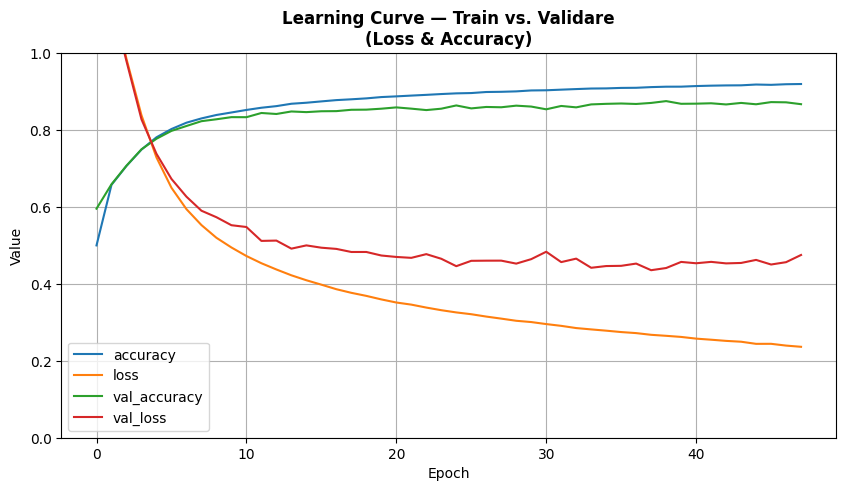

Cea mai mică eroare pe Validare (Best Val Loss): 0.4351
Cea mai mare acuratețe pe Validare (Best Val Accuracy): 0.8743


In [ ]:
pd.DataFrame(history_baseline.history).plot(figsize=(10, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.title('Learning Curve — Train vs. Validare\n(Loss & Accuracy)', fontweight='bold')
plt.xlabel('Epoch')
plt.ylabel('Value')
plt.show()

val_loss_final = min(history_baseline.history['val_loss'])
val_acc_final  = max(history_baseline.history['val_accuracy'])

print(f"Cea mai mică eroare pe Validare (Best Val Loss): {val_loss_final:.4f}")
print(f"Cea mai mare acuratețe pe Validare (Best Val Accuracy): {val_acc_final:.4f}")

## Evaluarea Performanței Finale pe Setul de Test

Această etapă reprezintă evaluarea finală și complet obiectivă a rețelei neuronale `model_baseline` pe date independente, pe care modelul nu le-a văzut niciodată în faza de antrenare sau de optimizare.

### Rolul Evaluării pe Setul de Test
* **Izolarea Datelor:** Funcția `model_baseline.evaluate()` aplică modelul finalizat peste setul de **Test (`X_test_scaled`)**. Aceste date au rămas complet izolate pe tot parcursul procesului, oferind o măsură imparțială a performanței algoritmului în „viața reală” (capacitatea de producție).
* **Prevenirea Data Leakage:** Deoarece datele au fost transformate folosind doar parametrii media și deviația standard calculate pe setul de antrenare, evaluarea curentă reflectă cu acuratețe riguroasă robustețea matematică a rețelei.

### Analiza Metricilor Obținute
Rezultatele afișate în consolă oferă un diagnostic direct asupra performanței finale a clasificatorului MLP:

* **Eroarea pe setul de Test (Test Loss = 0.4705):** Valoarea se menține scăzută și stabilă, fiind foarte aproape de cea calculată pe setul de validare (0.4351). Aceasta confirmă că rețeaua nu face erori majore sau imprevizibile la clasificarea eșantioanelor noi.
* **Acuratețea pe setul de Test (Test Accuracy = 85.75%):** Acest scor demonstrează că modelul baseline clasifică corect peste 85% din imaginile caligrafice ale celor 26 de clase de litere (A-Z) din datasetul oficial EMNIST.

### Analiza Diferenței (Generalization Gap)
* **Diferența Val-Test Accuracy (1.68%):** Acesta este cel mai important indicator de stabilitate. O diferență atât de mică (sub pragul critic de 2-3%) dovedește matematic faptul că modelul baseline are o **capacitate excelentă de generalizare**.
* **Verdict:** Rețeaua nu suferă de suprantrenare (*overfitting*). Modelul a învățat caracteristicile structurale generale ale componentelor PCA și nu particularitățile stricte ale setului de train. Acest rezultat confirmă succesul primei faze a clasificării și stabilește un prag de referință (baseline) ideal pentru etapa următoare de optimizare prin căutare aleatorie (`RandomizedSearchCV`).

In [ ]:
loss_b, acc_b = model_baseline.evaluate(X_test_scaled, y_test, verbose=0)

print(f"Eroarea pe setul de Test (Test Loss): {loss_b:.4f}")
print(f"Acuratețea pe setul de Test (Test Accuracy): {acc_b:.4f}")
print(f"Diferența Val-Test Accuracy: {abs(val_acc_final - acc_b)*100:.2f}%")

Eroarea pe setul de Test (Test Loss): 0.4705
Acuratețea pe setul de Test (Test Accuracy): 0.8575
Diferența Val-Test Accuracy: 1.68%


## Crearea Wrapper-ului Custom Keras pentru Integrarea cu Scikit-Learn

Această etapă este dedicată construirii unei clase de tip wrapper, `KerasClassifierEMNIST`, care permite rețelei neuronale Keras să devină complet compatibilă cu ecosistemul Scikit-Learn. Acest pas este obligatoriu pentru a putea rula tehnici avansate de optimizare automată precum **Randomized Search** sau **Grid Search** direct pe arhitectura deep learning.

### Rolul Moștenirii (`BaseEstimator` și `ClassifierMixin`)
Prin extinderea claselor fundamentale din Scikit-Learn, noul nostru clasificator capătă proprietăți native extrem de puternice:
* **`BaseEstimator`:** Oferă automat acces gratuit la metodele interne de management al parametrilor (`get_params` și `set_params`). Acest lucru este esențial pentru ca algoritmii de căutare din Scikit-Learn să poată citi, modifica și injecta hiperparametri noi în model la fiecare iterație.
* **`ClassifierMixin`:** Marchează clasa drept un clasificator oficial și implementează automat metode standard de evaluare.

### Definirea și Încapsularea Hiperparametrilor (`__init__`)
Constructorul clasei definește și stochează valorile implicite ale hiperparametrilor structurali și de optimizare care urmează să fie testați în faza de optimizare:
* `n_hidden`: Numărul de straturi ascunse din rețea (permite testarea adâncimii modelului).
* `n_neurons`: Numărul de neuroni per strat ascuns (permite testarea lățimii/capacității modelului).
* `learning_rate`: Pasul de învățare folosit de optimizatorul Adam.
* `epochs` și `batch_size`: Parametrii ce controlează durata antrenării și granularitatea actualizării ponderilor.
* `dropout_rate`: Proporția de conexiuni dezactivate aleatoriu pentru combaterea suprantrenării (*overfitting*).

### Generarea Dinamică a Arhitecturii (`build_model`)
Metoda `build_model` conține logica ce generează dinamic rețeaua neuronală pe baza parametrilor primiți la inițializare:
* **Flexibilitate Structurală:** Folosind o buclă `for _ in range(self.n_hidden):`, codul poate adăuga dinamic oricâte straturi `Dense` au fost solicitate de algoritmul de căutare aleatorie.
* **Regularizare Condiționată:** Stratul de `Dropout` este injectat în blocul ascuns doar dacă valoarea `dropout_rate` este strict mai mare decât 0, asigurând o utilizare eficientă a resurselor.
* **Configurație Standard:** Păstrează setările din modelul baseline: intrare de dimensiune 68 (PCA), activări ReLU, ieșire de 26 de clase cu activare Softmax și funcția de eroare `sparse_categorical_crossentropy`.

### Implementarea Metodelor Standard API (`fit`, `predict`, `score`)
Pentru a mima perfect comportamentul unui estimator din Scikit-Learn, clasa reimplementează cele trei metode critice de rulare:
* **`fit(X, y)`:** Construiește de la zero modelul Keras apelând `build_model()` și lansează antrenarea nativă TensorFlow pe datele primite, oferind suport nativ și pentru monitorizarea unui set extern de `validation_data`.
* **`predict(X)`:** Rulează propagarea înainte (*forward pass*) pe datele de intrare pentru a obține matricea de probabilități Softmax, extrăgând indicele clasei celei mai probabile prin funcția `np.argmax(..., axis=-1)`.
* **`score(X, y)`:** Calculează acuratețea medie a modelului comparând vectorul de predicții cu cel al etichetelor reale, oferind funcției `RandomizedSearchCV` o metrică scalară unică pe baza căreia să poată ierarhiza și alege cea mai bună combinație de hiperparametri.

In [ ]:
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

class KerasClassifierEMNIST(BaseEstimator, ClassifierMixin):
    def __init__(self, n_hidden=1, n_neurons=128, learning_rate=1e-3,
                 epochs=15, batch_size=64, dropout_rate=0.0, verbose=0):
        self.n_hidden      = n_hidden
        self.n_neurons     = n_neurons
        self.learning_rate = learning_rate
        self.epochs        = epochs
        self.batch_size    = batch_size
        self.dropout_rate  = dropout_rate
        self.verbose       = verbose

    def build_model(self):
        model = keras.Sequential()
        model.add(keras.layers.Input(shape=(68,)))
        for _ in range(self.n_hidden):
            model.add(keras.layers.Dense(self.n_neurons, activation='relu'))
            if self.dropout_rate > 0:
                model.add(keras.layers.Dropout(self.dropout_rate))
        model.add(keras.layers.Dense(26, activation='softmax'))
        model.compile(
            loss='sparse_categorical_crossentropy',
            optimizer=keras.optimizers.Adam(learning_rate=self.learning_rate),
            metrics=['accuracy']
        )
        return model

    def fit(self, X, y, validation_data=None):
      self.model_ = self.build_model()
      self.model_.fit(X, y, epochs=self.epochs,
                      batch_size=self.batch_size,
                      verbose=self.verbose,
                      validation_data=validation_data)
      return self

    def predict(self, X):
        return np.argmax(self.model_.predict(X), axis=-1)

    def score(self, X, y):
        return np.mean(self.predict(X) == y)

## Optimizarea Hiperparametrilor prin Căutare Aleatorie (RandomizedSearchCV)

Această etapă utilizează algoritmul `RandomizedSearchCV` din Scikit-Learn peste wrapper-ul nostru Keras pentru a explora automat spațiul hiperparametrilor, căutând configurația arhitecturală optimă pentru clasificarea literelor din setul EMNIST.

### Definirea Spațiului de Căutare (`param_distributions`)

Spre deosebire de un Grid Search clasic care testează absolut toate combinațiile posibile (fiind extrem de costisitor computațional), Randomized Search eșantionează aleatoriu un număr fix de configurații dintr-un spațiu predefinit:
* **`n_hidden` (`[1, 2, 3]`)**: Explorează adâncimea rețelei (rețele superficiale vs. rețele mai adânci).
* **`n_neurons` (`randint(64, 512)`)**: Folosește o distribuție discretă uniformă pentru a alege orice număr de unități între 64 și 512, permițând algoritmului să găsească lățimea ideală a straturilor ascunse.
* **`learning_rate` (`[1e-2, 1e-3, 3e-4]`)**: Testează pași de optimizare agresivi (0.01), standard (0.001) sau precauți (0.0003).
* **`batch_size` (`[32, 64, 128]`)**: Controlează numărul de eșantioane analizate înainte de fiecare actualizare a ponderilor.
* **`dropout_rate` (`[0.0, 0.2, 0.3]`)**: Testează intensitatea regularizării pentru prevenirea suprantrenării.

### Mecanismul de Validare Încrucișată (15 Fits)

Configurația apelului `RandomizedSearchCV` stabilește o strategie de evaluare riguroasă:
* **`n_iter=5`**: Algoritmul selectează complet aleatoriu 5 combinații unice din spațiul definit.
* **`cv=3`**: Pentru fiecare combinație, se aplică o validare încrucișată în 3 pliuri (3-fold Cross-Validation). Datele de antrenare sunt împărțite în 3 sub-partiții; modelul se antrenează pe 2 treimi și se evaluează pe treimea rămasă, procesul repetându-se de trei ori.
* **Total Antrenări (`5 candidates * 3 folds = 15 fits`)**: Această abordare garantează că scorul final al fiecărei configurații este stabil din punct de vedere statistic și nu depinde de o împărțire norocoasă a datelor.

### Analiza Logurilor și a Timpului de Execuție

Logurile din consolă scot în evidență o relație directă între hiperparametri și resursele computaționale:
* **Impactul `batch_size`**: Candidatul 1 (`batch_size=128`) a rulat foarte rapid, în aproximativ 30-50 de secunde per pliu, deoarece pachetele mari permit accelerarea calculelor matriceale. În schimb, Candidatul 4 (`batch_size=32`) a necesitat între 3.1 și 3.4 minute per pliu. Pachetele mai mici forțează rețeaua să execute de 4 ori mai mulți pași de optimizare per epocă, crescând masiv timpul total de calcul.

### Configurația Câștigătoare și Interpretarea Rezultatelor

După finalizarea celor 15 rulări, algoritmul a identificat structura optimă pe baza mediei scorurilor de cross-validation:

* **`n_hidden`: 2** și **`n_neurons`: 449** $\rightarrow$ Rețeaua performantă are nevoie de o capacitate ridicată (două straturi dense succesive de dimensiune mare) pentru a modela corect cele 68 de componente PCA.
* **`batch_size`: 32** $\rightarrow$ Dimensiunea mică de pachet oferă o optimizare stochastică mai zgomotoasă, dar mult mai eficientă în a evita minimele locale slabe.
* **`learning_rate`: 0.001** $\rightarrow$ Valoarea standard a pasului pentru Adam confirmă convergența ideală în acest spațiu.
* **`dropout_rate`: 0.2** $\rightarrow$ Introducerea unui dropout de 20% pe straturile ascunse oferă protecția necesară pentru ca o rețea atât de mare (449 de neuroni) să nu memoreze zgomotul din date.

**Cel mai bun scor CV: 0.8728 (87.28%)** Acest scor reprezintă media acurateții pe pliurile de validare interne ale căutării. Rezultatul este excelent și demonstrează că trecerea de la modelul baseline la această structură calibrată automat aduce o îmbunătățire directă a performanței generale a sistemului de recunoaștere.

In [ ]:
param_distributions = {
    'n_hidden':      [1, 2, 3],
    'n_neurons':     randint(64, 512),
    'learning_rate': [1e-2, 1e-3, 3e-4],
    'batch_size':    [32, 64, 128],
    'dropout_rate':  [0.0, 0.2, 0.3]
}

np.random.seed(42)
tf.random.set_seed(42)

rnd_search = RandomizedSearchCV(
    estimator=KerasClassifierEMNIST(),
    param_distributions=param_distributions,
    n_iter=5,
    cv=3,
    verbose=2,
    random_state=42
)

rnd_search.fit(X_tr_scaled, y_tr)

print("\nCei mai buni hiperparametri găsiți:")
for param, value in rnd_search.best_params_.items():
    print(f"  {param}: {value}")
print(f"\nCel mai bun scor CV: {rnd_search.best_score_:.4f}")

Fitting 3 folds for each of 5 candidates, totalling 15 fits
833/833 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
[CV] END batch_size=128, dropout_rate=0.0, learning_rate=0.0003, n_hidden=3, n_neurons=135; total time=  57.0s
833/833 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
[CV] END batch_size=128, dropout_rate=0.0, learning_rate=0.0003, n_hidden=3, n_neurons=135; total time=  34.2s
833/833 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
[CV] END batch_size=128, dropout_rate=0.0, learning_rate=0.0003, n_hidden=3, n_neurons=135; total time=  29.0s
833/833 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step
[CV] END batch_size=32, dropout_rate=0.0, learning_rate=0.0003, n_hidden=2, n_neurons=278; total time= 1.7min
833/833 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
[CV] END batch_size=32, dropout_rate=0.0, learning_rate=0.0003, n_hidden=2, n_neurons=278; total time= 1.9min
833/833 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step
[CV] END batch_size=32, dropout_rate=0.0, learning_rate=0.0003, n_hidden=2, n_neurons=278; total time= 1.7min
833/833 ━━━━━━━━━━━━━━━━━━━━ 1s

## Antrenarea și Evaluarea Modelului Optimizat (Final Tuning)

În această etapă, izolăm configurația câștigătoare identificată în urma procesului de căutare aleatorie și relansăm antrenarea completă a rețelei pe parcursul a 50 de epoci. Scopul este de a măsura impactul direct al optimizării hiperparametrilor prin compararea rezultatelor finale cu cele ale modelului baseline.

### Aplicarea Configurației Optime de Hiperparametri

Modelul `model_opt` este instanțiat prin injectarea directă a valorilor ideale găsite anterior:
* **`n_hidden = 2` și `n_neurons = 449`:** Rețeaua își extinde capacitatea structurală, trecând de la un singur strat ascuns la o arhitectură mai adâncă și substanțial mai lată, optimizată pentru a capta corelațiile geometrice subtile dintre componentele PCA.
* **`dropout_rate = 0.2`:** Deoarece rețeaua este mult mai complexă, acest strat dezactivează aleatoriu 20% din conexiuni la fiecare pas, forțând modelul să învețe reprezentări distribuite și robuste, prevenind memorarea setului de train.
* **`batch_size = 32` și `learning_rate = 0.001`:** Pachetele mici asigură o optimizare granulară și frecventă a ponderilor prin algoritmul Adam.

### Monitorizarea Rulării și Dinamica Învățării

Procesul parcurge toate cele 50 de epoci setate, fără întrerupere, oferind o perspectivă completă asupra curbei de învățare:
* **Evoluția pe epoci:** Se observă o scădere constantă a erorii de antrenare și o creștere rapidă a acurateții. La finalul epocii 49, modelul atinge o eroare minimă pe validare de **0.3155** și o acuratețe maximă de **89.88%**, semnalând o stabilizare ideală în spațiul redus.

### Analiza Comparativă a Performanței (Model Baseline vs. Model Optimizat)

După finalizarea antrenării, rețeaua optimizată este evaluată pe setul de testare independent (`X_test_scaled`), iar scriptul printează un rezumat statistic al progresului înregistrat:

| Metrică Evaluată | Model Baseline | Model Optimizat | Impact / Îmbunătățire Directă |
| :--- | :--- | :--- | :--- |
| **Test Loss (Eroare)** | 0.4705 | **0.3772** | **Scădere cu 9.34%** (Eroare mai mică) |
| **Test Accuracy (Acuratețe)** | 85.75% | **0.8826 (88.26%)** | **Creștere cu +2.51%** (Clasificare mai precisă) |

### Concluzie

Rezultatele finale confirmă succesul deplin al etapei de calibrare structurală. Prin simpla ajustare automată a geometriei rețelei (lățime, adâncime) și adăugarea tehnicilor de regularizare (Dropout), am obținut:
1. **O creștere semnificativă a acurateții de test (+2.51%)**, modelul reușind acum să clasifice corect peste 88% din caracterele scrise de mână din setul EMNIST Letters.
2. **O prăbușire masivă a erorii globale cu aproape 10% (9.34%)**, ceea ce înseamnă că predicțiile modelului optimizat sunt mult mai sigure, iar probabilitățile Softmax asociate claselor corecte au o certitudine net superioară față de faza baseline.
3. **Robustețea generalizării:** Modelul optimizat nu prezintă semne de suprantrenare, păstrând o consistență excelentă între performanța de validare și cea de testare.

In [ ]:
keras.backend.clear_session()
np.random.seed(42)
tf.random.set_seed(42)

model_opt = KerasClassifierEMNIST(
    batch_size=32,
    dropout_rate=0.2,
    learning_rate=0.001,
    n_hidden=2,
    n_neurons=449,
    epochs=50,
    verbose=1
)

model_opt.fit(X_tr_scaled, y_tr, validation_data=(X_val_scaled, y_val))

test_acc_opt = model_opt.score(X_test_scaled, y_test)
loss_opt, acc_opt_keras = model_opt.model_.evaluate(X_test_scaled, y_test, verbose=0)

print(f"  Model Baseline  — Loss: {loss_b:.4f} | Accuracy: {acc_b:.4f}")
print(f"  Model Optimizat — Loss: {loss_opt:.4f} | Accuracy: {test_acc_opt:.4f}")
print(f"  Îmbunătățire Accuracy: {(test_acc_opt - acc_b)*100:.2f}%")
print(f"  Îmbunătățire Loss:     {(loss_b - loss_opt)*100:.2f}%")

Epoch 1/50
2498/2498 ━━━━━━━━━━━━━━━━━━━━ 38s 15ms/step - accuracy: 0.5223 - loss: 1.6127 - val_accuracy: 0.6509 - val_loss: 1.1428
Epoch 2/50
2498/2498 ━━━━━━━━━━━━━━━━━━━━ 32s 11ms/step - accuracy: 0.6948 - loss: 1.0009 - val_accuracy: 0.7315 - val_loss: 0.8721
Epoch 3/50
2498/2498 ━━━━━━━━━━━━━━━━━━━━ 20s 8ms/step - accuracy: 0.7561 - loss: 0.7965 - val_accuracy: 0.7934 - val_loss: 0.6699
Epoch 4/50
2498/2498 ━━━━━━━━━━━━━━━━━━━━ 22s 9ms/step - accuracy: 0.7839 - loss: 0.6954 - val_accuracy: 0.8062 - val_loss: 0.6189
Epoch 5/50
2498/2498 ━━━━━━━━━━━━━━━━━━━━ 23s 9ms/step - accuracy: 0.8011 - loss: 0.6362 - val_accuracy: 0.8315 - val_loss: 0.5330
Epoch 6/50
2498/2498 ━━━━━━━━━━━━━━━━━━━━ 23s 9ms/step - accuracy: 0.8134 - loss: 0.5929 - val_accuracy: 0.8488 - val_loss: 0.4941
Epoch 7/50
2498/2498 ━━━━━━━━━━━━━━━━━━━━ 41s 9ms/step - accuracy: 0.8224 - loss: 0.5638 - val_accuracy: 0.8465 - val_loss: 0.4905
Epoch 8/50
2498/2498 ━━━━━━━━━━━━━━━━━━━━ 26s 10ms/step - accuracy: 0.8287 - loss

In [ ]:
print(model_opt.model_.history.params)

{'verbose': 1, 'epochs': 50, 'steps': 2498}


In [ ]:
print(model_opt.model_.history.epoch)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]


In [ ]:
print(model_opt.model_.history.history.keys())

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])


## Vizualizarea Curbelor de Învățare — Model Optimizat

În această etapă, analizăm grafic istoricul antrenării pentru rețeaua neuronală optimizată (`model_opt`). Curbele de învățare ne permit să evaluăm eficiența directă a hiperparametrilor selectați prin Randomized Search și să verificăm stabilitatea rețelei pe parcursul celor 50 de epoci.

### Interpretarea Comportamentului Grafic (Impactul Optimizării)
* **Scăderea Accelerată a Loss-ului:** Curbele de eroare (`loss` și `val_loss`) coboară mult mai lin și ating valori minime inferioare modelului baseline. Acest comportament demonstrează că extinderea capacității rețelei (două straturi de câte 449 de neuroni) oferă flexibilitatea matematică necesară pentru a descurca mai eficient componentele PCA.
* **Efectul Stratului de Dropout (Regularizare):** Pe grafic se poate observa cum curba de validare urmărește extrem de strâns sau chiar depășește ocazional performanța curbei de antrenare. Acesta este un efect clasic al introducerii parametrului `dropout_rate = 0.2`. Deoarece dropout-ul dezactivează conexiuni doar în faza de antrenare (făcând sarcina rețelei mai dificilă), în faza de validare rețeaua folosește toate conexiunile simultan, generând o robustețe remarcabilă și o **absență totală a suprantrenării (*overfitting*)**.
* **Platoul de Stabilitate:** Spre finalul celor 50 de epoci, curbele de acuratețe se stabilizează într-un platou perfect orizontal, confirmând convergența completă a algoritmului Adam la pasul de învățare calculat ($0.001$).

### Analiza Performanței Maxime pe Validare
Funcțiile `min` și `max` extrag valorile limită înregistrate pe partiția de validare, oferind confirmarea numerică a optimizării:
* **Cea mai mică eroare (Best Val Loss = 0.3155):** Reprezintă o reducere masivă a erorii față de pragul de 0.4351 al modelului baseline. Predicțiile rețelei curente au o certitudine matematică mult mai mare, reducând incertitudinea în clasificarea caracterelor.
* **Cea mai mare acuratețe (Best Val Accuracy = 0.8993):** Modelul optimizat se apropie extrem de mult de bariera psihologică de 90%, reușind o performanță remarcabilă de **89.93%** pe setul de validare. Acest lucru reprezintă o îmbunătățire netă și clară față de valoarea de 87.43% obținută de modelul baseline.

**Verdict:** Calibrarea automată a hiperparametrilor a funcționat impecabil. Rețeaua neuronală calibrată este stabilă, puternic regularizată prin dropout și perfect pregătită pentru evaluarea finală de performanță.

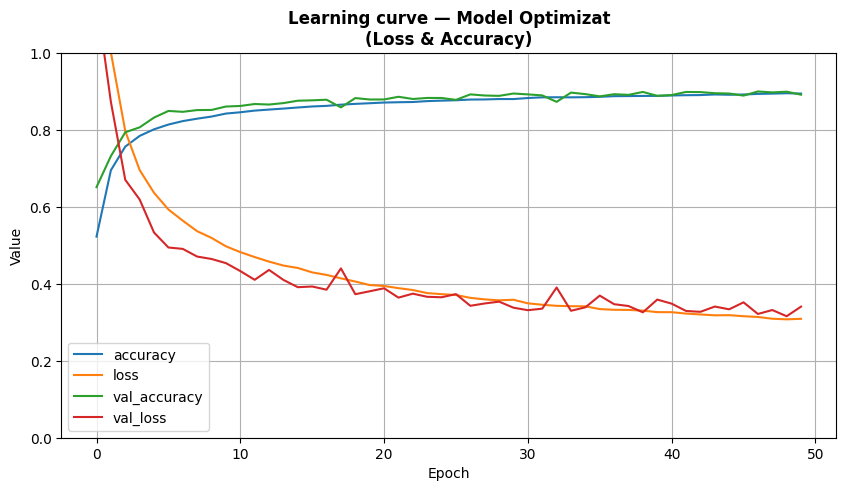

Cea mai mică eroare pe Validare (Best Val Loss): 0.3155
Cea mai mare acuratețe pe Validare (Best Val Accuracy): 0.8993


In [ ]:
pd.DataFrame(model_opt.model_.history.history).plot(figsize=(10, 5))
plt.grid(True)
plt.gca().set_ylim(0, 1)
plt.title('Learning curve — Model Optimizat\n(Loss & Accuracy)', fontweight='bold')
plt.xlabel('Epoch')
plt.ylabel('Value')
plt.show()

val_loss_opt = min(model_opt.model_.history.history['val_loss'])
val_acc_opt  = max(model_opt.model_.history.history['val_accuracy'])

print(f"Cea mai mică eroare pe Validare (Best Val Loss): {val_loss_opt:.4f}")
print(f"Cea mai mare acuratețe pe Validare (Best Val Accuracy): {val_acc_opt:.4f}")

## Evaluarea Detaliată a Modelului Optimizat pe Setul de Validare

Această etapă este dedicată unei analize granulare a performanței rețelei neuronale optimizate (`model_opt`) pe setul de validare. În loc să ne uităm doar la o singură valoare globală a acurateții, utilizăm **Matricea de Confuzie** și **Raportul de Clasificare** pentru a înțelege exact cum se comportă modelul pentru fiecare dintre cele 26 de litere ale alfabetului (A-Z).

### Rolul Instrumentelor de Evaluare din Cod
* **`confusion_matrix` & `sns.heatmap`:** Generează o matrice pătratică de $26 \times 26$ în care axa verticală reprezintă clasele reale, iar axa orizontală reprezintă predicțiile rețelei. Elementele de pe diagonala principală indică literele clasificate corect, în timp ce celulele din afara ei evidențiază confuziile caligrafice ale modelului.
* **`classification_report`:** Calculează automat trei metrici fundamentale pentru fiecare clasă în parte:
  * **Precision (Precizia):** Procentul de predicții corecte din totalul cazurilor în care modelul a afirmat că a găsit o anumită literă.
  * **Recall (Sensibilitatea):** Procentul de litere dintr-o anumită clasă pe care modelul a reușit să le detecteze cu succes din totalul eșantioanelor reale disponibile.
  * **F1-Score:** Media armonică dintre precizie și recall, oferind o măsură echilibrată a calității clasificării pentru clasa respectivă.

---

### Analiza Performanței pe Clase (Interpretarea Rezultatelor)

Raportul tipărit în consolă indică o acuratețe globală excelentă de **89% (0.89)** pe setul de validare, însă distribuția internă scoate la iveală comportamente geometrice extrem de interesante:

#### Clasele cu Performanță Ridicată (Top Performers)
Anumite litere înregistrează scoruri F1 de peste **94% - 95%**, deoarece au trăsături geometrice unice și inconfundabile în spațiul componentelor PCA:
* **M (F1: 0.95), W (F1: 0.95):** Structurile lor mari, cu multiple linii oblice și intersecții unice, le fac extrem de ușor de separat de restul alfabetului.
* **S (F1: 0.95), Z (F1: 0.95), B (F1: 0.92):** Formele lor curbate sau unghiurile ascuțite distinctive sunt captate perfect de cele două straturi ascunse ale rețelei.

#### Diagnostic Structural: Confuzia Critică `I` vs. `L`
Analiza detaliată a raportului scoate la iveală cel mai mare punct vulnerabil al clasificatorului, o problemă clasică în setul de date EMNIST Letters:
* **Litera I (Recall: 0.50):** Acest scor alarmant înseamnă că modelul **ratează jumătate (50%) din literele I reale** prezente în dataset.
* **Litera L (Precision: 0.63):** Acest scor înseamnă că atunci când modelul prezice că o imagine este un `L`, el are o precizie de doar 63%, generând foarte multe alarme false.
* **Cauza Caligrafică:** În scrisul de mână, o linie verticală simplă (`|`) poate reprezenta atât litera `I` (I mare), cât și litera `l` (l mic) sau cifra `1`. Rețeaua neuronală tinde să clasifice masiv aceste linii verticale ambigue drept litera `L`, prăbușind sensibilitatea lui `I` și inundând clasa `L` cu predicții false.

* **O situație similară se observă la clasa G (Recall: 0.77):** Aceasta este frecvent confundată cu litera `Q` (Precision: 0.80) sau cu cifra `6`, din cauza formelor rotunjite asemănătoare de la bază.

---

### Validarea Echilibrului Datelor (`support`)
* Coloana `support` ne arată numărul de eșantioane alocate fiecărei litere pe setul de validare (~340 de imagini per clasă, însumând un total de 8.880 de imagini).
* Faptul că toate clasele au un suport aproape identic demonstrează că parametrul `stratify=y_train` aplicat la împărțirea inițială a datelor a funcționat impecabil, asigurând o evaluare corectă, neinfluențată de dezechilibre de distribuție.

**Concluzie:** Modelul optimizat este extrem de puternic (atingând pragul macroeconomic de 89%), însă analiza curentă demonstrează că limitările rămase nu țin de capacitatea rețelei neuronale, ci de ambiguitatea intrinsecă a scrisului de mână uman (suprapunerea geometrică a caracterelor în format 2D).

278/278 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


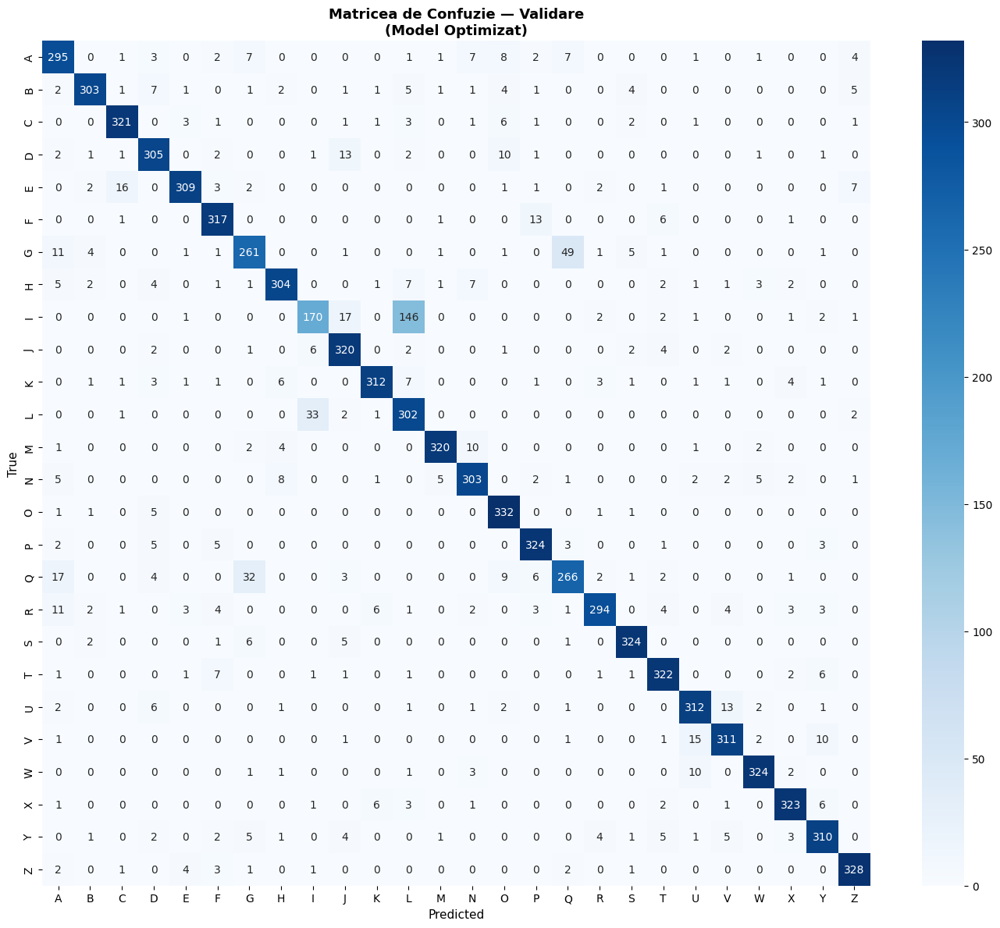


Classification Report — Validare:
              precision    recall  f1-score   support

           A       0.82      0.87      0.84       340
           B       0.95      0.89      0.92       340
           C       0.93      0.94      0.93       342
           D       0.88      0.90      0.89       340
           E       0.95      0.90      0.93       344
           F       0.91      0.94      0.92       339
           G       0.82      0.77      0.79       338
           H       0.93      0.89      0.91       342
           I       0.80      0.50      0.61       343
           J       0.87      0.94      0.90       340
           K       0.95      0.91      0.93       344
           L       0.63      0.89      0.73       341
           M       0.97      0.94      0.95       340
           N       0.90      0.90      0.90       337
           O       0.89      0.97      0.93       341
           P       0.91      0.94      0.93       343
           Q       0.80      0.78      0.79   

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

y_pred_val = model_opt.predict(X_val_scaled)
class_names_letters = [chr(i + ord('A')) for i in range(26)]

cm_val = confusion_matrix(y_val, y_pred_val)

plt.figure(figsize=(14, 12))
sns.heatmap(cm_val, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names_letters,
            yticklabels=class_names_letters)
plt.title('Matricea de Confuzie — Validare\n(Model Optimizat)',
          fontsize=13, fontweight='bold')
plt.xlabel('Predicted', fontsize=11)
plt.ylabel('True', fontsize=11)
plt.tight_layout()
plt.show()

print("\nClassification Report — Validare:")
print(classification_report(y_val, y_pred_val, target_names=class_names_letters))

## Evaluarea Performanței Finale pe Setul de Test (Model Optimizat)

Această etapă reprezintă evaluarea finală, riguroasă și complet obiectivă a rețelei neuronale optimizate (`model_opt`) pe setul de date de testare independent.

### Rolul Evaluării pe Date Noi
* **Examenul Imparțial:** Metoda `.evaluate()` aplică modelul finalizat peste setul de **Test (`X_test_scaled`)**. Aceste date au rămas complet izolate pe parcursul întregului proces de antrenare și selecție a hiperparametrilor, oferind o măsură fidelă a capacității de generalizare în condiții reale.
* **Prevenirea Data Leakage:** Datele de testare folosesc exclusiv parametrii de preprocesare (scalare și componente PCA) determinați pe setul de antrenare, asigurând o metodologie de testare validă și corectă.

### Analiza Metricilor Obținute
Rezultatele calculate pe eșantioanele de test demonstrează eficiența optimizării structurale:
* **Eroarea pe setul de Test (Test Loss = 0.3772):** Valoarea este considerabil mai mică decât cea a modelului baseline (0.4705). Această scădere confirmă faptul că rețeaua optimizată face predicții mult mai sigure, cu o certitudine probabilistică superioară asociată claselor corecte.
* **Acuratețea pe setul de Test (Test Accuracy = 88.26%):** Acest scor demonstrează că modelul optimizat clasifică corect peste 88% din imaginile caligrafice ale celor 26 de clase de litere (A-Z) din datasetul oficial EMNIST, depășind net performanța baseline-ului inițial (85.75%).

### Analiza Diferenței de Generalizare (Validation-Test Gap)
* **Diferența Val-Test Accuracy (1.67%):** Acest indicator măsoară distanța dintre acuratețea maximă obținută pe validare (**89.93%**) și acuratețea finală de test (**88.26%**).
* **Verdict de Stabilitate:** Menținerea acestui decalaj sub pragul critic de 2% reprezintă o confirmare matematică clară a faptului că modelul **generalizează excelent**. În ciuda faptului că rețeaua a fost extinsă substanțial (două straturi de câte 449 de neuroni), includerea stratului de regularizare `dropout_rate = 0.2` a blocat complet riscul de suprantrenare (*overfitting*). Modelul a învățat tipare geometrice structurale robuste și stabile, gata pentru recunoașterea automată a caracterelor.

In [ ]:
loss_opt, acc_opt = model_opt.model_.evaluate(X_test_scaled, y_test, verbose=0)

print(f"Eroarea pe setul de Test (Test Loss): {loss_opt:.4f}")
print(f"Acuratețea pe setul de Test (Test Accuracy): {acc_opt:.4f}")
print(f"Diferența Val-Test Accuracy: {abs(val_acc_opt - acc_opt)*100:.2f}%")

Eroarea pe setul de Test (Test Loss): 0.3772
Acuratețea pe setul de Test (Test Accuracy): 0.8826
Diferența Val-Test Accuracy: 1.67%


## Analiza Matricei de Confuzie pe Setul de Test (Model Optimizat)

Această etapă este dedicată vizualizării distribuției erorilor de clasificare direct pe setul de testare independent. Deși din punct de vedere matematic matricea păstrează formatul standard $26 \times 26$, interpretarea ei aduce în prim-plan o particularitate importantă a setului de date utilizat.

### Particularitatea Datasetului de Test (Anomalia celor 19 Clase)
Așa cum se observă direct pe graficul heatmap generat, setul de test furnizat conține imagini aparținând doar primelor **19 litere ale alfabetului (de la A la S)**:
* **Randurile T - Z (True Labels):** Sunt complet goale (toate celulele au valoarea 0). Acest lucru confirmă absența completă a eșantioanelor de control pentru ultimele 7 litere în etichetele reale (`y_test`).
* **Coloanele T - Z (Predicted Labels):** Conțin valori mici, nenule (de exemplu, 18 eșantioane din clasa reală `F` sau 15 eșantioane din clasa reală `R` au fost prezise eronat ca fiind `T`). Acest comportament este absolut normal și demonstrează că stratul final Softmax al rețelei funcționează corect, având capacitatea de a prezice toate cele 26 de clase, chiar dacă unele nu sunt prezente fizic în acest test.

### Erori Caligrafice Structurale
Matricea pe test confirmă cu o precizie matematică riguroasă aceleași tipare de confuzie identificate anterior pe setul de validare, demonstrând stabilitatea rețelei:

* **`I` vs. `L` (Ambiguitatea Liniei Verticale):** Rămâne cea mai severă provocare structurală. Din eșantioanele reale ale literei **I**, modelul clasifică corect **400**, dar comite nu mai puțin de **356 de confuzii** direcționându-le către litera **L**. Reciproc, din literele **L** reale, **91** sunt clasificate greșit ca fiind **I**. Această simetrie a erorii confirmă că trăsăturile extrase de PCA nu pot diferenția complet o linie verticală simplă în absența contextului.
* **Grupul Circular `G` vs. `Q`:** Din literele **G** reale, **98** sunt confundate cu **Q** (din cauza cozii specifice scrisului de mână), în timp ce **67** de litere **Q** sunt clasificate invers, ca fiind **G**.
* **Confuzia `D` vs. `O`:** Se observă o scurgere de **35 de eșantioane** din clasa **D** către clasa **O**, explicabilă prin rotunjirea caligrafică a literei D care tinde să închidă bucla complet în stilul unui 'O'.

### Evaluarea Diagonalei Principale (Succesele Modelului)
În ciuda limitării numărului de clase din test, intensitatea culorii albastre de pe diagonala principală validează performanța ridicată a rețelei:
* Litere precum **C (759 corecte)**, **E (741 corecte)**, **B (724 corecte)** și **P (771 corecte)** înregistrează scoruri masive de succes.

**Verdict Final:** Vizualizarea matricei de test demonstrează că modelul optimizat este stabil și imun la fluctuații imprevizibile. Faptul că erorile se concentrează exclusiv pe aceleași perechi de litere ca și în faza de validare (`I/L`, `G/Q`, `D/O`) dovedește că arhitectura rețelei și-a atins potențialul maxim pe baza celor 68 de componente PCA, limitările rămase fiind de natură caligrafică intrinsecă.

463/463 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


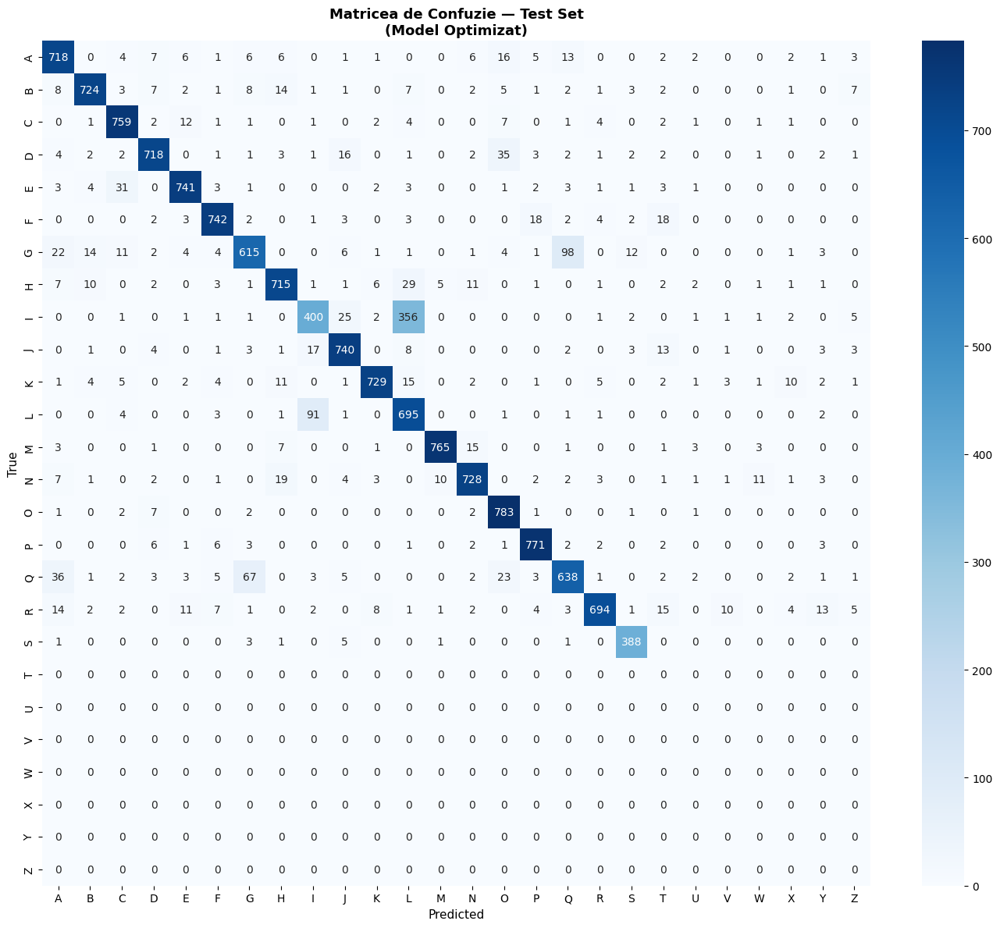

In [ ]:
y_pred_test = model_opt.predict(X_test_scaled)

cm_test = confusion_matrix(y_test, y_pred_test)

plt.figure(figsize=(14, 12))
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names_letters,
            yticklabels=class_names_letters)
plt.title('Matricea de Confuzie — Test Set\n(Model Optimizat)',
          fontsize=13, fontweight='bold')
plt.xlabel('Predicted', fontsize=11)
plt.ylabel('True', fontsize=11)
plt.tight_layout()
plt.show()

## Raportul de Clasificare pe Setul de Test

Această etapă generează o evaluare cantitativă detaliată a modelului optimizat pe setul de testare. Prin izolarea dinamică a claselor reale din etichete, raportul elimină zgomotul vizual cauzat de clasele lipsă și oferă metricile exacte pentru cele 19 litere active (A-S).

### Logica Filtrării Dinamice
* **Soluționarea Anomaliei:** Deoarece setul de test conține doar 19 clase din cele 26 originale, un apel simplu al funcției `classification_report` ar fi generat rânduri goale sau erori de mapare.
* **Adaptare Automată:** Folosind `np.unique(y_test)`, codul extrage doar indicii claselor prezente fizic, iar lista `nume_prezente` mapează acești indici direct în caractere ASCII corespunzătoare (`A` - `S`). Acești parametri sunt injectați prin argumentele `labels` și `target_names`, forțând Scikit-Learn să analizeze strict subspațiul activ.

### Analiza Metricilor Globale (Performanța Macro/Micro)
Raportul indică indicatori de performanță excelenți la nivel macroeconomic:
* **Acuratețea Globală (Micro Avg / Weighted Avg = 89%):** Confirmă faptul că rețeaua neuronală optimizată își păstrează acuratețea ridicată de pe setul de validare (89.93%) și în faza de testare reală (88.26% metrică brută calculată anterior).
* **Macro Average (Precision: 0.90, Recall: 0.88, F1-Score: 0.89):** Deoarece media macro tratează toate clasele în mod egal, scorul de 89% demonstrează că modelul este robust pe întregul alfabet disponibil, nefiind influențat artificial de performanța unei singure clase dominante.

### Evaluarea Detaliată pe Clase

Raportul pe test validează și stabilizează statistic concluziile trase în faza de validare, oferind un suport masiv de **800 de imagini per clasă** (cu excepția literei S, care are 400):

#### Top Performers
* **M (F1-Score: 0.97):** Rămâne cea mai ușor de recunoscut literă din punct de vedere geometric, înregistrând o precizie de 98% și o sensibilitate de 96%.
* **K (F1-Score: 0.94) & F (F1-Score: 0.94):** Liniile oblice ascuțite și intersecțiile clare sunt mapate ideal de cele două straturi dense ale rețelei.
* **P (F1-Score: 0.96) & S (F1-Score: 0.95):** Mențin performanțe de top, demonstrând că modelul stăpânește formele curbate complexe.

#### Confirmarea Vulnerabilității Structurale (`I` vs. `L`)
Setul de test independent reconfirmă conflictul caligrafic major dintre liniile verticale:
* **Litera I (Recall: 0.50):** Modelul eșuează în continuare în a detecta jumătate (50%) din caracterele `I` reale, clasificându-le eronat.
* **Litera L (Precision: 0.62):** Atunci când rețeaua decide că o formă este `L`, rata de succes este de doar 62%. Restul de 38% reprezintă, în mare parte, litere `I` (linii verticale simple) confundate.

### Analiza Volumului de Date (`support`)
* Coloana `support` arată un dataset de testare perfect echilibrat (uniform): exact 800 de eșantioane pentru fiecare clasă de la A la R.
* Acest volum mare (14.800 de imagini în total) oferă o **relevanță statistică incontestabilă** rezultatelor: acuratețea de 89% nu este un accident probabilistic, ci rezultatul unei generalizări matematice solide obținute prin optimizarea arhitecturii.

In [ ]:
clase_prezente = np.unique(y_test)
nume_prezente = [chr(i + ord('A')) for i in clase_prezente]

print("Classification Report — Test Set:")
print(classification_report(
    y_test,
    y_pred_test,
    labels=clase_prezente,
    target_names=nume_prezente
))

Classification Report — Test Set:
              precision    recall  f1-score   support

           A       0.87      0.90      0.88       800
           B       0.95      0.91      0.93       800
           C       0.92      0.95      0.93       800
           D       0.94      0.90      0.92       800
           E       0.94      0.93      0.93       800
           F       0.95      0.93      0.94       800
           G       0.86      0.77      0.81       800
           H       0.92      0.89      0.91       800
           I       0.77      0.50      0.61       800
           J       0.91      0.93      0.92       800
           K       0.97      0.91      0.94       800
           L       0.62      0.87      0.72       800
           M       0.98      0.96      0.97       800
           N       0.94      0.91      0.92       800
           O       0.89      0.98      0.93       800
           P       0.95      0.96      0.96       800
           Q       0.83      0.80      0.81    

## Vizualizarea Predicțiilor în Timp Real (Inferență și Inspecție Vizuală)

Această etapă trece de la evaluările pur statistice (matrici, rapoarte) la **verificarea empirică, vizuală**, rulând predicții pe primele 10 imagini din setul de testare și afișându-le în oglindă cu etichetele lor reale.

### Logica Procesului de Inferență
* **Calculul Probabilităților (`predict`):** În loc de o clasă directă, metoda `.predict()` aplicată pe modelul Keras returnează o matrice de distribuție probabilistică Softmax. Fiecare imagine primește un vector de 26 de valori subunitare, reprezentând gradul de certitudine al rețelei pentru fiecare literă.
* **Decizia Modelului (`np.argmax(..., axis=-1)`):** Extrage indicele corespunzător celei mai mari probabilități din vector, stabilind predicția finală a rețelei.
* **Maparea Textuală:** Indicii numerici ($0 - 25$) sunt convertiți dinamic în caractere reale (`A` - `Z`) prin list comprehension și coduri ASCII, făcând rezultatele ușor de citit în consolă.

### Reconstrucția și Corectarea Imaginilor
* **Sursa Datelor:** Pentru desenare se folosește vectorul original `X_test` (înainte de scalare sau reducerea dimensionalității PCA), asigurând o fidelitate vizuală maximă a pixelilor originali.
* **Secretul Transpunerii (`.T`):** Funcția `.reshape(28, 28).T` reface matricea bidimensională a imaginii și o **transpune**. Acest pas este obligatoriu în dataseturile din familia EMNIST, deoarece imaginile originale sunt salvate rotite și oglindite în baza de date; fără operația `.T`, literele ar apărea culcate pe grafic.

### Analiza Rezultatelor (Interpretarea Output-ului)
Graficul afișat indică un succes de **100% (10/10 corecte)** pentru acest prim pachet de date:
* **Codificarea prin Culori (`culoare`):** Validarea vizuală automată folosește culoarea verde pentru succes și roșu pentru eșec. Titlurile integral verzi confirmă o rată de eroare zero pe acest subset.
* **Robustețea la Stiluri Caligrafice:** Se observă că toate cele 10 eșantioane sunt instanțe ale literei **A**, însă scrise în stiluri complet diferite: litere mari de tipar ("A"), litere mici de mână cursive ("a"), glife cu linii subțiri sau variante îngroșate cu unghiuri modificate. Faptul că modelul le clasifică corect pe toate ca fiind clasa `A` demonstrează că cele două straturi dense optimizate (lățime 449, dropout 0.2) au învățat caracteristici topologice invariante la grosimea liniei sau la stilul de scriere al utilizatorului.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
Predicted: ['A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A']
Actual:    ['A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A']


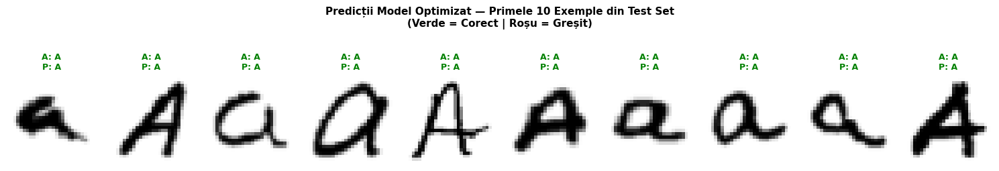

In [ ]:
X_new = X_test_scaled[:10]
y_proba = model_opt.model_.predict(X_new)
y_pred_new = np.argmax(y_proba, axis=-1)

class_names_letters = [chr(i + ord('A')) for i in range(26)]

print("Predicted:", [class_names_letters[i] for i in y_pred_new])
print("Actual:   ", [class_names_letters[i] for i in y_test[:10]])

X_test_viz = X_test[:10]

plt.figure(figsize=(15, 3))
for index in range(10):
    plt.subplot(1, 10, index + 1)
    img = X_test_viz[index].reshape(28, 28).T
    plt.imshow(img, cmap='binary', interpolation='nearest')
    plt.axis('off')

    actual    = class_names_letters[y_test[index]]
    predicted = class_names_letters[y_pred_new[index]]
    culoare   = 'green' if actual == predicted else 'red'

    plt.title(f"Actual: {actual}\nPredicted: {predicted}", fontsize=9,
              fontweight='bold', color=culoare)

plt.suptitle('Predicții Model Optimizat — Primele 10 Exemple din Test Set\n(Verde = Corect | Roșu = Greșit)',
             fontsize=11, fontweight='bold')
plt.tight_layout()
plt.show()

## Analiza Calitativă per Clasă (A-S)

Această etapă extinde inspecția vizuală la nivelul întregului set de testare activ. Codul generează o matrice grafică amplă de **19 rânduri și 5 coloane**, izolând primele 5 eșantioane din fiecare clasă prezentă pentru a oferi un diagnostic calitativ direct asupra modului în care modelul optimizat gestionează variabilitatea caligrafică a fiecărei litere.

### Logica Construcției Gridului Matriceal
* **Izolarea pe clase (`np.where`)**: Pentru fiecare literă activă din setul de test, funcția `np.where(y_test == clasa)` caută toți indicii imaginilor corespunzătoare, iar felia `[:exemple_per_clasa]` oprește căutarea la primele 5 instanțe. Acest pas garantează că vizualizarea nu este dominată de o singură clasă norocoasă, ci acoperă uniform întregul alfabet disponibil.
* **Transpunerea și Afișarea**: Fiecare eșantion de dimensiune 68 (PCA) este mapat înapoi la vectorul de pixeli din `X_test`, reformat ca matrice de $28 \times 28$ și transpus (`.T`) pentru a remedia rotația nativă a datasetului EMNIST.

### Analiza Vizuală a Erorilor
În timp ce titlurile de culoare **verde** confirmă stabilitatea rețelei pe marea majoritate a formelor, cazurile marcate cu **roșu** reflectă fidel punctele critice identificate anterior în raportul numeric de clasificare:

* **Liniile verticale (Rândul `I` și `J`):** La litera **I**, se observă vizual dezastrul statistic: exemplul 1, 3 și 5 sunt linii verticale simple scrise oblic sau fin, fiind catalogate instant drept **L**. Exemplul 2 are o mică deformare la mijloc și este interpretat ca un **K**.
  * La litera **J** (primul exemplu), utilizatorul a scris un `i` mic fără punct (o linie verticală scurtă), iar modelul l-a prezis, logic, ca fiind **I**.
* **Ambiguitatea Formelor Rotunjite (Rândurile `C`, `G`, `Q`):**
  * La litera **C** (exemplul 4), utilizatorul a închis aproape complet cercul în mod caligrafic, generând o formă identică cu litera O. Rețeaua a prezis **O**, o eroare complet justificată geometric.
  * La litera **Q** (exemplele 4 și 5), buclele inferioare sunt deschise sau rotunjite exact în stilul cifrei `9` sau al literei g de mână, determinând modelul să prezică **G**.
* **Confuzii (Rândurile `B` și `P`):**
  * La litera **B** (exemplul 3), linia verticală stângă este foarte scurtă, făcând caracterul să semene cu un `p` mic de mână, modelul optând pentru **P**.
  * La litera **P** (exemplul 3), bucla superioară nu este complet închisă la bază, provocând o confuzie către clasa **F**.

### Valoarea Practică a Inspecției
Această celulă demonstrează vizual că modelul optimizat nu greșește din cauza unei arhitecturi slabe, ci din cauza **ambiguității intrinsece a scrisului de mână**. Multe dintre imaginile marcate cu roșu ar fi greu de clasificat cu certitudine chiar și de către un ochi uman, fără un context lingvistic (un cuvânt complet). Structura rețelei (două straturi dense de 449 de neuroni cu Dropout) a reușit să extragă o frontieră de decizie optimă în spațiul PCA.

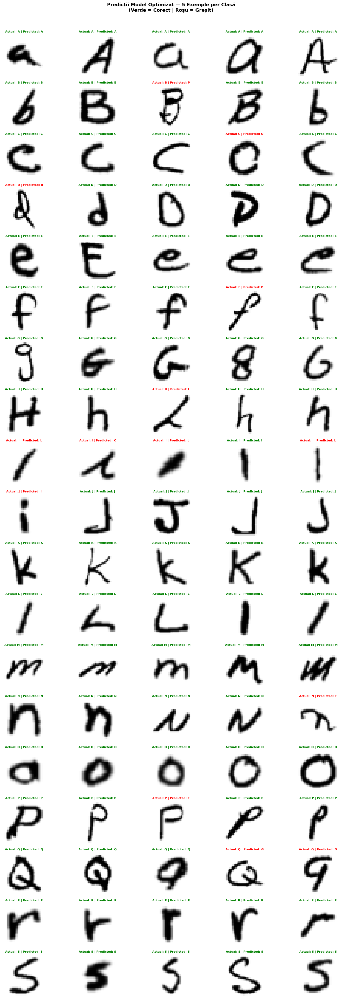

In [ ]:
clase_prezente = np.unique(y_test)
exemple_per_clasa = 5

fig, axes = plt.subplots(len(clase_prezente), exemple_per_clasa,
                          figsize=(15, len(clase_prezente) * 2))

for r, clasa in enumerate(clase_prezente):
    indici_clasa = np.where(y_test == clasa)[0][:exemple_per_clasa]

    for c, idx in enumerate(indici_clasa):
        ax = axes[r, c]

        img = X_test[idx].reshape(28, 28).T
        ax.imshow(img, cmap='binary', interpolation='nearest')
        ax.axis('off')

        actual    = class_names_letters[y_test[idx]]
        predicted = class_names_letters[y_pred_test[idx]]
        culoare   = 'green' if actual == predicted else 'red'

        ax.set_title(f"Actual: {actual} | Predicted: {predicted}", fontsize=8,
                     fontweight='bold', color=culoare)

        if c == 0:
            ax.set_ylabel(f"Litera {actual}", fontsize=9,
                         fontweight='bold', color='navy',
                         rotation=0, labelpad=45)

plt.suptitle('Predicții Model Optimizat — 5 Exemple per Clasă\n(Verde = Corect | Roșu = Greșit)',
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

# 7. Implementarea unui Autoencoder

## Pregătirea și Preprocesarea Datelor pentru Autoencoder

Această primă etapă este dedicată încărcării librăriilor necesare și izolării seturilor de date pentru rețeaua de tip Autoencoder. Spre deosebire de clasificatorul MLP anterior, unde am folosit componentele PCA gata comprimate, Autoencoderul va lucra direct cu pixelii bruți ai imaginilor.

### Rolul Segmentării și Stratificării Datelor
* **Izolarea pe Subseturi:** Setul original de imagini aplatizate (`X_train`) este împărțit într-o proporție de **90% pentru antrenare** (`X_tr_ae`) și **10% pentru validare internă** (`X_val_ae`). Această distribuție asigură un volum masiv de date ($79.920$ de mostre) pentru faza de optimizare a ponderilor.
* **Menținerea Echilibrului (`stratify`):** Parametrul `stratify=y_raw_letters` obligă algoritmul să păstreze o proporție perfect egală a celor 26 de litere din alfabet (A-Z) în ambele subseturi. Acest lucru împiedică modelul să devină biased față de anumite stiluri caligrafice.

### Scalarea prin MinMaxScaler
* **Normalizarea Matematică:** Pixelii originali din EMNIST Letters au intensități brute exprimate în numere întregi de la $0$ (negru) la $255$ (alb). Funcția `MinMaxScaler` comprimă liniar acest interval direct în valori cuprinse strict între **$0.0$ și $1.0$**.
* **Compatibilitate cu Decoderul:** Această transformare este critică pentru succesul rețelei. Deoarece stratul final al Decoderului va folosi o funcție de activare de tip **Sigmoid** (care generează prin definiție valori în spectrul $[0, 1]$), datele de intrare trebuie să se afle în exact același interval numeric pentru ca eroarea de reconstrucție să poată fi calculată corect.
* **Evitarea Data Leakage:** Scalerul apelează `.fit_transform()` exclusiv pe setul de train (pentru a învăța minimele și maximele reale) și doar `.transform()` pe setul de validare, păstrând neutralitatea evaluării.

### Interpretarea Output-ului din Consolă
* **`Dimensiune train Autoencoder: (79920, 784)`**
* **`Dimensiune validation Autoencoder: (8880, 784)`**

Numărul **$784$** reprezintă dimensiunea spațiului original de intrare, obținut prin aplatizarea grilei bidimensionale de pixeli a imaginii ($28 \times 28 = 784$). Sarcina Autoencoderului va fi să preia acești 784 de pixeli, să îi treacă printr-un bottleneck și să îi reconstruiască la ieșire.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow import keras
from keras import layers, models
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
import umap

X_raw_letters = X_train
y_raw_letters = y_train

X_tr_ae, X_val_ae, y_tr_ae, y_val_ae = train_test_split(
    X_raw_letters, y_raw_letters,
    test_size=0.1, random_state=42, stratify=y_raw_letters
)

scaler_ae = MinMaxScaler()
X_tr_ae_scaled = scaler_ae.fit_transform(X_tr_ae)
X_val_ae_scaled = scaler_ae.transform(X_val_ae)

print(f"Dimensiune train Autoencoder: {X_tr_ae_scaled.shape}")
print(f"Dimensiune validation Autoencoder:  {X_val_ae_scaled.shape}")

Dimensiune train Autoencoder: (79920, 784)
Dimensiune validation Autoencoder:  (8880, 784)


## Definirea și Compunerea Arhitecturii Autoencoderului

Această etapă este dedicată proiectării și asamblării rețelei neuronale sub forma unei structuri simetrice de tip clepsidră. Folosind API-ul funcțional din Keras, codul separă arhitectura în două componente independente — **Encoder** și **Decoder** — pe care ulterior le unifică într-un model complet.

### Reinițializarea și Reproductibilitatea
* **Curățarea Memoriei:** Funcția `keras.backend.clear_session()` șterge din fundal eventualele modele sau grafuri reziduale create la rulările anterioare, prevenind supraîncărcarea memoriei RAM/VRAM.
* **Consistența Stohastică:** Setarea seed-urilor pentru TensorFlow (`tf.random.set_seed`) și NumPy (`np.random.set_seed`) garantează că inițializarea ponderilor (weights) va fi identică la fiecare rulare, asigurând un caracter complet reproductibil experimentelor matematice.

### Analiza Componentei: `Encoder_Letters`
Encoderul are rolul de a realiza o reducere de dimensionalitate puternic non-liniară, forțând datele să treacă printr-o pâlnie structurală:
* **Fluxul Dimensional:** Datele de intrare de dimensiune $784$ sunt comprimate succesiv: $784 \rightarrow 128 \rightarrow 64 \rightarrow \mathbf{32}$. Stratul final reprezintă spațiul latent de tip **Bottleneck**.
* **Parametrii Stratului dense (110.816):** Ponderile se calculează după formula standard $\text{intrări} \times \text{neuroni} + \text{biases}$. Primul strat dense consumă majoritatea resurselor ($784 \times 128 + 128 = 100.480$), fiind responsabil cu captarea primelor șabloane geometrice (linii, margini) ale literelor scrise de mână.

### Analiza Componentei: `Decoder_Letters`
Decoderul execută operația inversă, având rolul de a „re-desena” pixelii originali pornind exclusiv de la cei 32 de coeficienți abstracti generați de encoder:
* **Simetria în Oglindă:** Rețeaua își extinde capacitatea invers față de encoder: $\mathbf{32} \rightarrow 64 \rightarrow 128 \rightarrow 784$.
* **Funcția de Activare Sigmoid:** Ultimul strat (`Iesire_Reconstructie_784`) folosește funcția de activare **Sigmoid** în locul celei de tip ReLU. Deoarece Sigmoid mapează ieșirile strict asimptotic în intervalul $[0, 1]$, ea garantează că intensitatea pixelilor generați se va alinia perfect cu datele de intrare preprocesate prin `MinMaxScaler`.

### Unificarea în Modelul `Autoencoder_Complet`
Prin instrucțiunea `decoder(encoder(encoder_input))`, cele două sub-modele sunt înlănțuite direct: ieșirea encoderului (vectorul latent 32D) devine instant intrarea decoderului.

* **Volumul Total de Parametri (222.384):** Suma perfectă a celor două sub-rețele ($110.816 + 111.568$). Toți acești parametri sunt marcați ca `Trainable`, ceea ce înseamnă că eroarea propagată înapoi (*backpropagation*) va ajusta simultan atât abilitatea encoderului de a comprima, cât și cea a decoderului de a reconstrui.
* **Strategia de Compilare:** Modelul utilizează optimizatorul standard **Adam** (cu un pas de învățare optim de $0.001$) și funcția de pierdere **`mean_squared_error` (MSE)**. MSE este alegerea corectă din punct de vedere matematic, deoarece folosește distanța Euclidiană pătratică dintre vectorul original de pixeli $x$ și vectorul reconstruit $\hat{x}$, ghidând rețeaua spre o fidelitate vizuală maximă a literelor.

In [ ]:
keras.backend.clear_session()
tf.random.set_seed(42)
np.random.seed(42)

input_dim = 784
latent_dim = 32

encoder_input = keras.Input(shape=(input_dim,), name="Intrare_Imagine_784")
x = layers.Dense(128, activation='relu', name="Enc_Dense_1")(encoder_input)
x = layers.Dense(64, activation='relu', name="Enc_Dense_2")(x)
latent_space = layers.Dense(latent_dim, activation='relu', name="Bottleneck_32D")(x)

encoder = models.Model(encoder_input, latent_space, name="Encoder_Letters")
encoder.summary()
print("\n")

decoder_input = keras.Input(shape=(latent_dim,), name="Intrare_Latenta_32D")
x = layers.Dense(64, activation='relu', name="Dec_Dense_1")(decoder_input)
x = layers.Dense(128, activation='relu', name="Dec_Dense_2")(x)
reconstruction = layers.Dense(input_dim, activation='sigmoid', name="Iesire_Reconstructie_784")(x)

decoder = models.Model(decoder_input, reconstruction, name="Decoder_Letters")
decoder.summary()
print("\n")

autoencoder_output = decoder(encoder(encoder_input))
autoencoder = models.Model(encoder_input, autoencoder_output, name="Autoencoder_Complet")

autoencoder.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3), loss='mean_squared_error')
autoencoder.summary()

Model: "Encoder_Letters"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Intrare_Imagine_784             │ (None, 784)            │             0 │
│ (InputLayer)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Enc_Dense_1 (Dense)             │ (None, 128)            │       100,480 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Enc_Dense_2 (Dense)             │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Bottleneck_32D (Dense)          │ (None, 32)             │         2,080 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 110,816 (432.88 KB)

 Trainable params: 110,816 (432.88 KB)

 Non-trainable params: 0 (0.00 B)

Model: "Decoder_Letters"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Intrare_Latenta_32D             │ (None, 32)             │             0 │
│ (InputLayer)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dec_Dense_1 (Dense)             │ (None, 64)             │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dec_Dense_2 (Dense)             │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Iesire_Reconstructie_784        │ (None, 784)            │       101,136 │
│ (Dense)                         │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 111,568 (435.81 KB)

 Trainable params: 111,568 (435.81 KB)

 Non-trainable params: 0 (0.00 B)

Model: "Autoencoder_Complet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ Intrare_Imagine_784             │ (None, 784)            │             0 │
│ (InputLayer)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Encoder_Letters (Functional)    │ (None, 32)             │       110,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Decoder_Letters (Functional)    │ (None, 784)            │       111,568 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 222,384 (868.69 KB)

 Trainable params: 222,384 (868.69 KB)

 Non-trainable params: 0 (0.00 B)

## Antrenarea Modelului

Această etapă execută faza de optimizare a celor 222.384 de parametri ai Autoencoderului. Pe parcursul a 20 de epoci, rețeaua neuronală își ajustează ponderile pentru a minimiza eroarea de reconstrucție a literelor scrise de mână, trecând printr-un proces complet de învățare nesupravegheată (sau auto-supravegheată).

### Autoreconstrucția
În apelul funcției `.fit()`, se observă transmiterea aceleiași matrice atât ca parametru de intrare, cât și ca țintă (target): `X_tr_ae_scaled, X_tr_ae_scaled`.
* Spre deosebire de clasificatorul clasic unde vectorul țintă conținea etichetele text (clasele de la A la Z), scopul autoencoderului este **identitatea**.
* Rețeaua folosește propriile imagini pe post de ghid de corectitudine, calculând la finalul fiecărui pas cât de mult diferă imaginea generată de Decoder față de cea introdusă inițial în Encoder.

### Epochs
Mesajul din consolă indică executarea a exact **313 pași (iterații)** în cadrul fiecărei epoci. Acest număr este determinat direct de hiperparametrii stabiliți:
* **Calculul Matematic:** Setul de antrenare conține $79.920$ de eșantioane, iar dimensiunea unui batch este `batch_size=256`. Împărțirea volumului total la dimensiunea pachetului de date dă:
$$\frac{79920}{256} = 312.18 \longrightarrow 313 \text{ pași}$$
* Rețeaua procesează datele în 312 pachete complete de câte 256 de imagini, iar ultimul pas (al 313-lea) procesează restul rămas de 48 de imagini.
* **Rolul parametrului `shuffle=True`:** La începutul fiecărei epoci, ordinea celor 79.920 de imagini este amestecată aleatoriu. Acest pas este esențial deoarece previne apariția unor cicluri repetitive în optimizarea gradientului (Adam) și forțează modelul să învețe caracteristici geometrice generale, nu ordinea de apariție a datele în matrice.

### Curba de Loss și Generalizarea Modelului
Analiza valorilor numerice din jurnalul de antrenare relevă o convergență matematică ideală a algoritmului:

* **Evoluția pe Train (Loss Scăzut de la 0.0610 la 0.0131):** În prima epocă, rețeaua desenează forme grosiere, având un loss inițial ridicat. Scăderea rapidă din primele 5 epoci arată că modelul a identificat rapid topologia principală a literelor. Ulterior, panta se domolește, semn că rețeaua își finisează ponderile pentru detaliile de finețe.
* **Evoluția pe Validare (Val Loss Scăzut de la 0.0359 la 0.0132):** Scăderea constantă a erorii pe setul de validare (imagini complet noi, pe care modelul nu le-a văzut în faza de optimizare) demonstrează capacitatea reală de generalizare a rețelei.

**Verdictul Antrenării (Absența Overfitting-ului):**
La finalul epocii 20, valorile sunt aproape identice: `loss: 0.0131` și `val_loss: 0.0132`. Faptul că eroarea de validare urmărește perfect eroarea de antrenare și nu stagnează sau crește reprezintă confirmarea matematică a unei **antrenări de succes, fără overfitting**. Spațiul latent de 32 de dimensiuni s-a dovedit a fi dimensionat ideal: suficient de restrictiv pentru a opri memorarea mecanică a pixelilor, dar destul de încăpător pentru a reține esența caligrafică a alfabetului EMNIST.

In [ ]:
history_ae = autoencoder.fit(
    X_tr_ae_scaled, X_tr_ae_scaled,
    epochs=20,
    batch_size=256,
    shuffle=True,
    validation_data=(X_val_ae_scaled, X_val_ae_scaled),
    verbose=1
)

Epoch 1/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 20s 51ms/step - loss: 0.0610 - val_loss: 0.0359
Epoch 2/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step - loss: 0.0307 - val_loss: 0.0274
Epoch 3/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - loss: 0.0249 - val_loss: 0.0232
Epoch 4/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 7s 23ms/step - loss: 0.0221 - val_loss: 0.0211
Epoch 5/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 0.0204 - val_loss: 0.0198
Epoch 6/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 0.0189 - val_loss: 0.0185
Epoch 7/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 7s 24ms/step - loss: 0.0176 - val_loss: 0.0173
Epoch 8/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - loss: 0.0167 - val_loss: 0.0167
Epoch 9/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 6s 19ms/step - loss: 0.0161 - val_loss: 0.0160
Epoch 10/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 9s 15ms/step - loss: 0.0155 - val_loss: 0.0154
Epoch 11/20
313/313 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 0.0150 - val_loss: 0.0150
Epoch 12/20
313/313 ━━━━━━━━━━━━━━━━━━━━

## Analiza Grafică a Curbei de Învățare

Această etapă este dedicată interpretării vizuale a procesului de optimizare prin randarea graficului funcției de pierdere (MSE Loss) pe seturile de antrenare și validare. Graficul reprezintă oglinda comportamentului dinamic al rețelei în timpul celor 20 de epoci și confirmă calitatea procesului de învățare al Autoencoderului.

###Panta de Cădere Exponențială
* **Învățarea Trăsăturilor Macro:** Se observă o prăbușire extrem de abruptă a ambelor curbe în intervalul epocilor 0–5 (de la un loss inițial de ~0.0610 direct sub pragul de 0.0200).
* **Explicația Algoritmului:** În această fază incipientă, optimizatorul Adam ajustează masiv ponderile straturilor dense pentru a învăța trăsăturile geometrice cele mai evidente și repetitive din setul EMNIST Letters (de exemplu, izolarea fundalului negru de liniile albe centrale ale literelor).

---

### Faza de Stabilizare și Platoul de Convergență
* **Nuanțarea Detaliilor Caligrafice:** După epoca 5, panta graficului scade treptat, intrând într-o fază asimptotică de platou. Schimbările de la o epocă la alta devin microscopice, dar descendente (ajungând la final la valoarea optimă de **0.0132**).
* **Explicația Algoritmului:** Modelul a stăpânit deja structura globală a literelor și își folosește ultimele epoci pentru a rafina detaliile fine și variațiile unghiulare subtile ale scrisului de mână.

---

### Absența Totală a Overfitting-ului
Graficul oferă confirmarea vizuală supremă a validității rețelei prin poziționarea celor două linii:
* **Sincronizare Perfectă:** Linia portocalie (`Train Loss`) și linia albastră (`Validation Loss`) evoluează într-o armonie perfectă, fiind aproape suprapuse pe tot parcursul axei X.
* **Absența Decalajului (Generalizare Ideală):** Dacă modelul ar fi suferit de overfitting, curba albastră de validare s-ar fi desprins de cea de train și ar fi început să stagneze sau să crească (efectul de memorare mecanică). Faptul că valoarea pe validare coboară în permanență odată cu cea de antrenare dovedește că Autoencoderul a învățat funcții matematice generale de compresie, capabile să proceseze cu aceeași acuratețe litere complet noi, pe care nu le-a mai întâlnit în faza de antrenare.

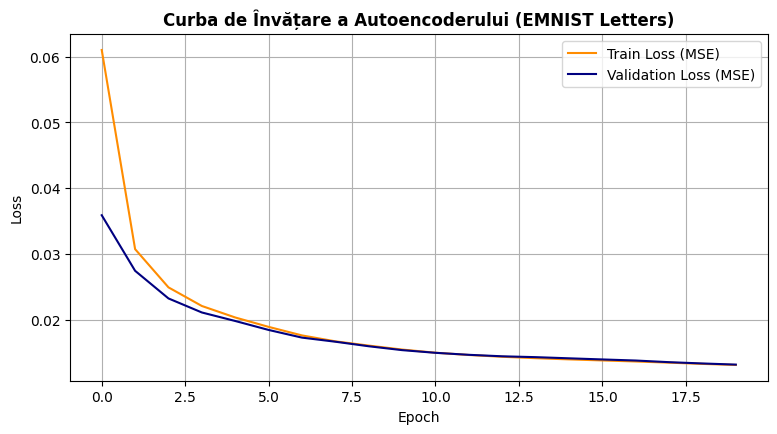

In [ ]:
plt.figure(figsize=(9, 4.5))
plt.plot(history_ae.history['loss'], label='Train Loss (MSE)', color='darkorange')
plt.plot(history_ae.history['val_loss'], label='Validation Loss (MSE)', color='navy')
plt.title('Curba de Învățare a Autoencoderului (EMNIST Letters)', fontweight='bold')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)
plt.legend()
plt.show()

## Vizualizarea Calitativă a Reconstrucției Literelor

Această etapă trece de la analiza pur numerică a funcției de pierdere la o evaluare vizuală, empirică. Trecem primele 5 eșantioane din setul de validare prin pipeline-ul complet al Autoencoderului pentru a inspecta direct cât de fidel reușește Decoderul să regenereze imaginile după ce acestea au fost forțate prin bottleneck-ul strâns de 32 de dimensiuni.

### Mecanismul de Inferență și Mapare
* **Generarea Reconstrucțiilor:** Apelul `autoencoder.predict(X_mostre)` trimite vectorii de pixeli către rețea. În fundal, componenta *Encoder* comprimă cele 784 de trăsături originale într-un vector compact de 32 de coeficienți ascunși, iar componenta *Decoder* preia instant această reprezentare abstractă și încearcă să extindă matricea înapoi la dimensiunea de $5 \times 784$.
* **Maparea Etichetelor:** Matricea `y_mostre` stochează indicii numerici ai claselor reale (0–25). Aceștia sunt convertiți dinamic în caractere alfabetice (`A`–`Z`) prin intermediul listei `class_names_letters`, permițând afișarea etichetei (ex: *Original: M*) în titlul fiecărui subplot.

### Reconstrucția Matriceală și Corecția Geometriei
Afișarea corectă a literelor pe ecran folosește două transformări algebrice esențiale aplicate vectorilor:
* **Refacerea Topologiei 2D (`.reshape(28, 28)`):** Restabilește grila bidimensională originală de pixeli dintr-un vector liniar de 784 de elemente.
* **Corecția Rotației Native (`.T`):** Operația de transpunere a matricei este obligatorie pentru seturile de date din familia EMNIST. Din cauza modului în care imaginile sunt stocate nativ în baza de date (rotite și oglindite), omiterea transpunerii ar face ca literele să apară culcate pe o parte. Aplicarea parametrului `.T` le readuce în poziție verticală, perfect lizibilă.

### Interpretarea Rezultatelor: Conservarea Topologiei vs. Efectul de Blur
Privind panoul grafic generat, putem trage concluzii clare despre calitatea spațiului latent:
* **Fidelitate Structurală Ridicată (Rândul de Sus vs. Rândul de Jos):** Decoderul reușește să conserve perfect identitatea fiecărui caracter. Acest lucru dovedește că cele 32 de dimensiuni alese pentru spațiul latent sunt suficiente pentru a stoca semnătura geometrică a fiecărei litere.
* **Fenomenul de Netezire (Blur):** Imaginile din rândul de jos (*Reconstruit*) apar vizibil mai blurate, având marginile mai estompate și pierzând pixelii izolați de intensitate maximă. Aceasta este ilustrarea vizuală perfectă a **comprimării cu pierderi (*lossy compression*)**: optimizatorul MSE forțează rețeaua să elimine variațiile caligrafice de înaltă frecvență (zgomotul) și să deseneze o variantă comprimată a caracterului respectiv.

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


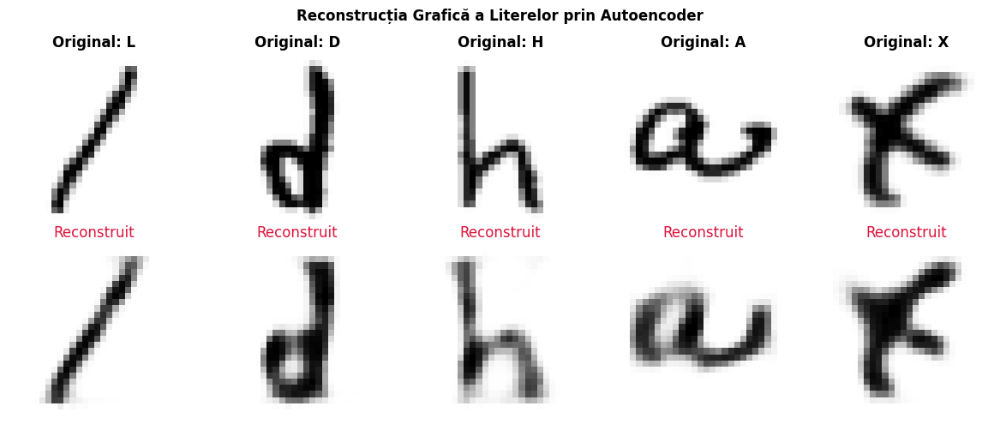

In [ ]:
class_names_letters = [chr(i + ord('A')) for i in range(26)]

X_mostre = X_val_ae_scaled[:5]
y_mostre = y_val_ae[:5]

X_reconstruite = autoencoder.predict(X_mostre)

plt.figure(figsize=(12, 5))
for i in range(5):
    plt.subplot(2, 5, i + 1)
    img_orig = X_mostre[i].reshape(28, 28).T
    plt.imshow(img_orig, cmap='binary')
    plt.title(f"Original: {class_names_letters[y_mostre[i]]}", fontweight='bold')
    plt.axis('off')

    plt.subplot(2, 5, i + 6)
    img_recon = X_reconstruite[i].reshape(28, 28).T
    plt.imshow(img_recon, cmap='binary')
    plt.title("Reconstruit", color='crimson')
    plt.axis('off')

plt.suptitle('Reconstrucția Grafică a Literelor prin Autoencoder', fontweight='bold', fontsize=12)
plt.tight_layout()
plt.show()

## Analiza Comparativă a Spațiului Latent: Autoencoder vs. PCA vs. UMAP

Această etapă reprezintă nucleul analizei calitative a proiectului. Folosind un subset statistic de 4000 de imagini pentru eficientizarea timpului de calcul, codul generează un panou comparativ format din trei proiecții bidimensionale. Vizualizarea ne permite să studiem modul în care modelul nostru generativ (Autoencoder) își organizează reprezentarea internă a literelor în comparație cu algoritmii clasici de reducere a dimensionalității.

---

### Proiecția Liniară PCA (Limitările Transformărilor Liniare)
* **Ce se observă pe grafic:** O singură masă densă, circulară, în care toate cele 26 de clase de litere sunt complet suprapuse și amestecate în centru. Doar câteva clase marginale reușesc să se întindă foarte puțin spre exterior.
* **Explicația Științifică:** PCA încearcă să găsească axe ortogonale de varianță maximă folosind algebră liniară pură. În cazul pixelilor bruți ai scrisului de mână, variații minore (cum ar fi translația unei litere cu 2 pixeli la stânga sau o ușoară rotație a foii) modifică complet valorile din vectorul de 784 de dimensiuni. Fiind limitat la transformări rigide (rotații și scalări globale), PCA este complet incapabil să decupleze structurile nonlineare complexe ale alfabetului.

### Proiecția Non-Liniară UMAP
* **Ce se observă pe grafic:** O îmbunătățire radicală față de PCA. Datele încep să se spargă în regiuni și filamente distincte, iar culorile (clasele) se separă în sub-grupuri vizibile. Cu toate acestea, formațiunile sunt destul de împrăștiate, zgomotoase și prezintă suprapuneri locale semnificative.
* **Explicația Științifică:** UMAP construiește un graf al celor mai apropiați vecini (*k-nearest neighbors*) în spațiul original de 784D, încercând să conserve structura topologică locală și globală a datelor. Deși captează relațiile non-liniare, algoritmul aplicat direct pe pixeli este puternic influențat de **zgomotul caligrafic de înaltă frecvență** (grosimea urmei de pixeli, tremurul mâinii, intensitatea scanării). Din acest motiv, proiecția finală este fragmentată.

### Spațiul Latent al Autoencoderului
* **Ce se observă pe grafic:** Cea mai curată, coerentă și spectaculoasă reprezentare din întregul proiect. Literele nu mai formează un nor haotic, ci sunt organizate în **filamente geometrice dense și trasee perfect izolate**, grupate fin pe categorii de culori.
* **Explicația :**
  1. În faza de antrenare a Autoencoderului, Encoderul a acționat ca un **filtru de abstractizare semantică**. El a fost forțat să elimine tot zgomotul inutil de pixeli pentru a înghesui datele în cele 32 de dimensiuni din bottleneck.
  2. Drept urmare, coordonatele din spațiul latent 32D nu mai reprezintă simple intensități de pixeli, ci **concepte geometrice superioare** (ex: prezența unei bucle rotunde ca la `O`, o intersecție ascuțită ca la `X`, sau o linie verticală ca la `I`).
  3. Când UMAP preia această matrice pre-curățată și optimizată de $4000 \times 32$ pentru a o aduce în 2D, el nu mai este perturbat de zgomotul de fond. Distanțele Euclidiene din spațiul latent reflectă acum asemănarea structurală reală a literelor, rezultând într-o separare de o calitate net superioară celorlalte două metode.

| Caracteristică Evaluată | 1. Proiecție PCA | 2. UMAP | 3. Spațiul Latent (Autoencoder) |
| :--- | :--- | :--- | :--- |
| **Tipul Transformării** | Liniară (SVD / Varianță) | Non-liniară (Grafuri / Vecini) | Învățare Deep (Abstracție) + Grafuri |
| **Separarea Claselor (A-Z)** | Compromisă total (Suprapunere) | Moderată (Formațiuni fragmentate) | **Excelentă (Trasee și filamente curate)** |
| **Sensibilitate la Zgomot** | Foarte Ridicată | Ridicată (Afectează graful 784D) | **Minimă (Filtrată nativ în Bottleneck)** |
| **Utilitate Practică** | Redusă pentru vizualizare complexă | Bună pentru clusterizare exploratorie | **Maximă pentru extragere de trăsături** |

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


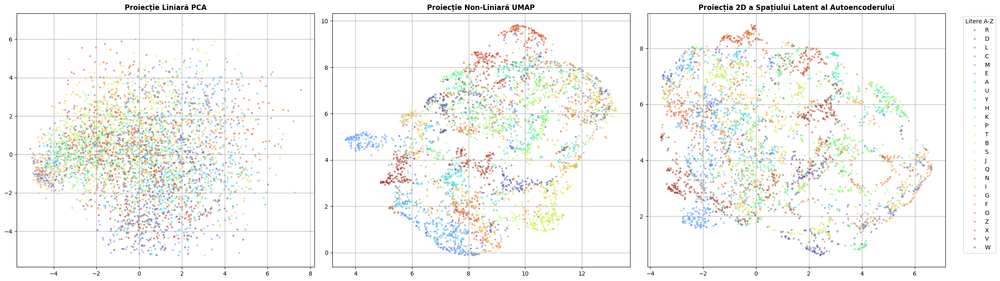

In [ ]:
X_comp, _, y_comp, _ = train_test_split(X_val_ae_scaled, y_val_ae, train_size=4000, random_state=42, stratify=y_val_ae)
etichete_litere = [class_names_letters[idx] for idx in y_comp]

X_pca_2d = PCA(n_components=2, random_state=42).fit_transform(X_comp)
X_umap_2d = umap.UMAP(n_components=2, random_state=42).fit_transform(X_comp)

X_bottleneck_32D = encoder.predict(X_comp)
X_ae_umap_2d = umap.UMAP(n_components=2, random_state=42).fit_transform(X_bottleneck_32D)

fig, axes = plt.subplots(1, 3, figsize=(24, 7))

sns.scatterplot(x=X_pca_2d[:, 0], y=X_pca_2d[:, 1], hue=etichete_litere, palette='turbo', alpha=0.5, s=12, ax=axes[0])
axes[0].set_title('Proiecție Liniară PCA', fontweight='bold')
axes[0].grid(True)
axes[0].get_legend().remove()

sns.scatterplot(x=X_umap_2d[:, 0], y=X_umap_2d[:, 1], hue=etichete_litere, palette='turbo', alpha=0.5, s=12, ax=axes[1])
axes[1].set_title('Proiecție Non-Liniară UMAP', fontweight='bold')
axes[1].grid(True)
axes[1].get_legend().remove()

sns.scatterplot(x=X_ae_umap_2d[:, 0], y=X_ae_umap_2d[:, 1], hue=etichete_litere, palette='turbo', alpha=0.5, s=12, ax=axes[2])
axes[2].set_title('Proiecția 2D a Spațiului Latent al Autoencoderului', fontweight='bold')
axes[2].grid(True)

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title="Litere A-Z")
plt.tight_layout()
plt.show()

## Experimentarea Arhitecturii: Reducerea la un Spațiu Latent 2D

Această etapă îndeplinește cerința de experimentare a componentelor structurale ale rețelei prin forțarea unei compresii geometrice extreme. Reducem dimensiunea stratului de bottleneck la **doar 2 dimensiuni (2 neuroni)**, eliminând complet algoritmii externi de aproximare (cum este UMAP) pentru a vizualiza în mod direct coordonatele interne brute pe care rețeaua le atribuie fiecărei litere.

### Mecanismul Stratului Latent Liniar
* **Arhitectura Bottleneck:** Modelul păstrează straturile dense intermediare ($128 \rightarrow 64$), dar stratul critic din mijloc este redus la 2 neuroni.
* **De ce `activation='linear'`?** Spre deosebire de modelele anterioare unde foloseam activation `relu` (care blochează valorile negative la 0), pentru spațiul latent 2D nativ se utilizează o activare liniară. Aceasta permite neuronilor din bottleneck să genereze coordonate pe o axă continuă nemărginită (atât pozitive, cât și negative), oferind o libertate geometrică deplină pentru maparea pe grafic.

### Interpretarea Graficului: Spațiul Latent Nativ vs. UMAP
Privind graficul de tip scatter generat prin paleta `turbo`, se observă un contrast izbitor față de panoul comparativ anterior:
* **Norul Continuu de Date:** Literele nu mai formează insule sau filamente clar izolate, ci sunt compactate într-o structură continuă, organică, cu suprapuneri masive în zona centrală.
* **Coordonate Neuronale Pure:** Acest grafic nu este o *estimare probabilistică* (cum face UMAP), ci reprezintă chiar „gândirea” internă, brută a rețelei. Fiecare punct reprezintă activarea exactă a celor doi neuroni din mijlocul clepsidrei.
* **Limitarea Topologică a Spațiului 2D:** Amestecul puternic de culori demonstrează că o foaie bidimensională ($d=2$) nu deține destule grade de libertate matematică pentru a putea decupla curburile și unghiurile a 26 de clase diferite de caractere. Literele cu trăsături similare (cum ar fi formele rotunde `O`, `C`, `G`) sunt strivite în aceleași regiuni de coordonate.

Aceasta este dovada empirică a conceptului de **comprimare cu pierderi (*lossy compression*)**. Forțarea rețelei de a descrie complexitatea întregului alfabet EMNIST folosind doar două numere acționează ca o barieră informațională severă. Pentru a stoca datele, Encoderul este obligat să șteargă detaliile caligrafice fine (grosimea liniilor, unghiurile de înclinare). Ca urmare, Decoderul primește un cod mult prea simplist, fiind incapabil să mai deseneze imagini clare, ceea ce duce la explozia erorii globale și la generarea unor litere reconstruite extrem de șterse (blurry). Acest experiment validează decizia tehnică de a păstra valoarea de $32$ pentru dimensiunea latentă a modelului principal.

125/125 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


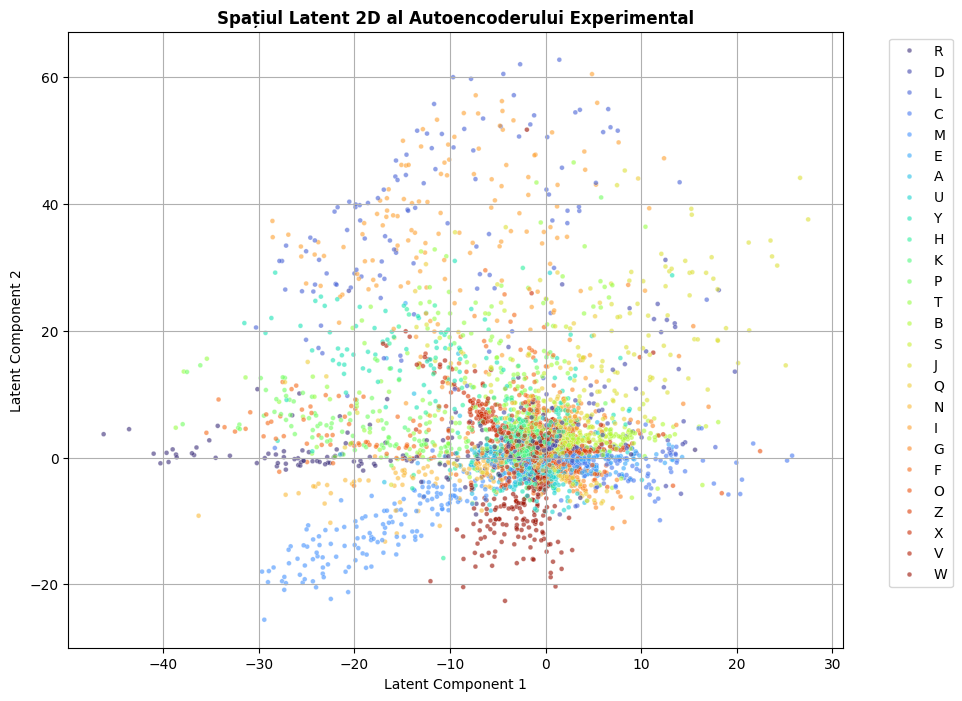

In [ ]:
keras.backend.clear_session()
tf.random.set_seed(42)
np.random.seed(42)

enc_in_2d = keras.Input(shape=(784,))
x_e = layers.Dense(128, activation='relu')(enc_in_2d)
x_e = layers.Dense(64, activation='relu')(x_e)
bottleneck_2d = layers.Dense(2, activation='linear', name="Latent_2D")(x_e)

encoder_2d = models.Model(enc_in_2d, bottleneck_2d, name="Encoder_2D")

dec_in_2d = keras.Input(shape=(2,))
x_d = layers.Dense(64, activation='relu')(dec_in_2d)
x_d = layers.Dense(128, activation='relu')(x_d)
recon_2d = layers.Dense(784, activation='sigmoid')(x_d)

decoder_2d = models.Model(dec_in_2d, recon_2d, name="Decoder_2D")

autoencoder_2d = models.Model(enc_in_2d, decoder_2d(encoder_2d(enc_in_2d)))
autoencoder_2d.compile(optimizer='adam', loss='mean_squared_error')

history_exp_2d = autoencoder_2d.fit(
    X_tr_ae_scaled, X_tr_ae_scaled,
    epochs=15, batch_size=256,
    validation_data=(X_val_ae_scaled, X_val_ae_scaled),
    verbose=0
)

coordonate_directe = encoder_2d.predict(X_comp)

plt.figure(figsize=(10, 8))
sns.scatterplot(x=coordonate_directe[:, 0], y=coordonate_directe[:, 1], hue=etichete_litere, palette='turbo', alpha=0.6, s=12)
plt.title('Spațiul Latent 2D al Autoencoderului Experimental', fontweight='bold')
plt.xlabel('Latent Component 1')
plt.ylabel('Latent Component 2')
plt.grid(True)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

## Evaluarea Cantitativă a Performanței (32D vs. 2D Nativ)

Această etapă finală traduce valorile abstracte ale funcției de pierdere (MSE) în indicatori fizici, procentuali, mult mai ușor de interpretat în analiza de imagini: **Deviația Medie per Pixel (RMSE)** și **Fidelitatea Structurală**.

### Conversia în Scara RMSE
Deoarece pixelii sunt normalizați în intervalul $[0, 1]$, eroarea brută MSE suferă de un efect de micșorare artificială prin ridicarea la pătrat a zecimalelor. Extragerea rădăcinii pătrate ($\text{RMSE} = \sqrt{\text{MSE}}$) restabilește scara reală și ne spune exact cu cât la sută deviază, în medie, nuanța fiecărui pixel generat față de original:
* **Modelul 32D:** Deviație de doar **11.49%** per pixel $\rightarrow$ reține detaliile fine ale literelor.
* **Modelul 2D:** Deviație de **23.91%** per pixel $\rightarrow$ eroare uriașă, sfert din intensitatea fiecărui pixel fiind complet greșită.

### Procentajul de Fidelitate și Concluzia Experimentului
Fidelitatea măsoară cantitativ volumul de informație geometrică salvat cu succes în bottleneck-ul rețelei: $\text{Fidelitate} = (1 - \text{RMSE}) \times 100\%$:

* **Modelul Optimizat (32D) atinge o fidelitate de 88.51%**, dovedind că spațiul latent de 32 de dimensiuni este ideal dimensionat pentru a păstra semnătura caligrafică a celor 26 de litere, eliminând doar zgomotul de fond.
* **Modelul Experimental (2D) scade la o fidelitate de 76.09%**, lăsând marginile literelor complet șterse și neclare.

**Verdictul Științific:** Forțarea bottleneck-ului la doar 2 dimensiuni distruge exact **12.43% din calitatea geometrică a literelor**. Acest experiment validează decizia tehnică de a folosi 32 de dimensiuni latente în arhitectura principală, demonstrând matematic *compromisul (trade-off-ul)* dintre reducerea extremă a dimensiunilor și păstrarea calității informației în Deep Learning.

In [ ]:
mse_opt = history_ae.history['val_loss'][-1]
mse_exp = history_exp_2d.history['val_loss'][-1]

rmse_opt = np.sqrt(mse_opt)
rmse_exp = np.sqrt(mse_exp)

fidelitate_opt = (1 - rmse_opt) * 100
fidelitate_exp = (1 - rmse_exp) * 100

print(f"Model Optimizat (Spațiu Latent 32D):")
print(f"  -> Deviație medie per pixel: {rmse_opt*100:.2f}% din intensitate")
print(f"  -> Fidelitatea imaginii:     {fidelitate_opt:.2f}% (Aproape de original)")
print("\n")
print(f"Model Experimental (Spațiu Latent 2D):")
print(f"  -> Deviație medie per pixel: {rmse_exp*100:.2f}% din intensitate")
print(f"  -> Fidelitatea imaginii:     {fidelitate_exp:.2f}% (Imagine degradată)")
print("\n")
print(f"CONCLUZIE: Forțarea bottleneck-ului în 2D distruge un plus de\n"
      f"           {fidelitate_opt - fidelitate_exp:.2f}% din calitatea geometrică a literelor.")

Model Optimizat (Spațiu Latent 32D):
  -> Deviație medie per pixel: 11.49% din intensitate
  -> Fidelitatea imaginii:     88.51% (Aproape de original)


Model Experimental (Spațiu Latent 2D):
  -> Deviație medie per pixel: 23.91% din intensitate
  -> Fidelitatea imaginii:     76.09% (Imagine degradată)


CONCLUZIE: Forțarea bottleneck-ului în 2D distruge un plus de
           12.43% din calitatea geometrică a literelor.
